In [1]:
import pandas as pd

In [2]:
df = pd.read_csv("VENTAS_TROCIUK3.csv", sep=",", encoding="latin-1", quotechar='"', on_bad_lines="skip")


In [3]:
# Contar ocurrencias en la columna "DESCRIPCION"
descripcion_counts = df["DESCRIPCION"].value_counts()

# Filtrar los valores con más de 365 registros
filtered_descriptions = descripcion_counts[descripcion_counts > 3650].index.tolist()

len(filtered_descriptions)


40

In [4]:
!pip install prophet


  Using cached stanio-0.5.1-py3-none-any.whl.metadata (1.6 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 1.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 820.7/820.7 kB 2.4 MB/s eta 0:00:00a 0:00:01
Using cached stanio-0.5.1-py3-none-any.whl (8.1 kB)


In [26]:
import pandas as pd

# --- Define a function to generate fixed-date holidays for each year ---
def generate_py_fixed_holidays(start_year=2003, end_year=2025):
    """
    Generates a DataFrame of fixed-date Paraguayan holidays (NO moveable ones).
    Adjust or add more holidays as needed.
    """
    years = range(start_year, end_year + 1)
    holiday_list = []
    
    for y in years:
        # 1 Jan - Año Nuevo
        holiday_list.append({"holiday": "Año Nuevo", "ds": pd.to_datetime(f"{y}-01-01")})
        # 1 Mar - Día de los Héroes (fixed date)
        holiday_list.append({"holiday": "Día de los Héroes", "ds": pd.to_datetime(f"{y}-03-01")})
        # 1 May - Día del Trabajador
        holiday_list.append({"holiday": "Día del Trabajador", "ds": pd.to_datetime(f"{y}-05-01")})
        # 14 May - Independencia de Paraguay (often celebrated 14th & 15th, here just 14th)
        holiday_list.append({"holiday": "Día de Independencia", "ds": pd.to_datetime(f"{y}-05-14")})
        # 12 Jun - Paz del Chaco
        holiday_list.append({"holiday": "Paz del Chaco", "ds": pd.to_datetime(f"{y}-06-12")})
        # 15 Aug - Fundación de Asunción
        holiday_list.append({"holiday": "Fundación de Asunción", "ds": pd.to_datetime(f"{y}-08-15")})
        # 29 Sep - Victoria de Boquerón
        holiday_list.append({"holiday": "Victoria de Boquerón", "ds": pd.to_datetime(f"{y}-09-29")})
        # 8 Dec - Virgen de Caacupé
        holiday_list.append({"holiday": "Virgen de Caacupé", "ds": pd.to_datetime(f"{y}-12-08")})
        # 25 Dec - Navidad
        holiday_list.append({"holiday": "Navidad", "ds": pd.to_datetime(f"{y}-12-25")})

    return pd.DataFrame(holiday_list)

# Generate the fixed holidays from 2003 to 2025
holidays_df = generate_py_fixed_holidays(2003, 2025)


In [57]:
import os
import pandas as pd
import numpy as np
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics

# ============================================================================
# Suponiendo que tu DataFrame original se llama 'df' y contiene:
# - "DESCRIPCION" (producto)
# - "FECHA" (string '%d/%m/%Y')
# - "TOTAL_CANTIDAD"
# (Opcional) Variables externas (PRECIO, CLIMA...) si las usarás como regresores
#
# df = pd.read_csv("tus_datos.csv", ...)

# ----------------------------------------------------------------------------
# 1) Crear un directorio de salida
output_dir = "forecasts"
os.makedirs(output_dir, exist_ok=True)

# 2) Generar (o cargar) festivos de Paraguay
py_public_holidays = generate_py_fixed_holidays(2003, 2025)

# 3) Lista de productos
productos = df["DESCRIPCION"].unique()

# ----------------------------------------------------------------------------
for producto in productos:
    # Filtrar datos para el producto
    df_producto = df[df["DESCRIPCION"] == producto].copy()
    
    # Renombrar columnas a ds, y
    df_producto = df_producto.rename(columns={
        "FECHA": "ds",
        "TOTAL_CANTIDAD": "y"
    })
    df_producto["ds"] = pd.to_datetime(df_producto["ds"], format="%d/%m/%Y")
    
    # Entrenar hasta el 30/06/2024
    cutoff_date = pd.to_datetime("2024-06-30")
    df_train = df_producto[df_producto["ds"] <= cutoff_date].copy()
    
    # Verificamos al menos 2 filas válidas
    if df_train["y"].notnull().sum() < 2:
        print(f"Producto {producto} omitido: muy pocos datos.")
        continue
    
    # A) Recorte de outliers (percentil 5 y 95)
    p5 = df_train["y"].quantile(0.05)
    p95 = df_train["y"].quantile(0.95)
    df_train = df_train[(df_train["y"] >= p5) & (df_train["y"] <= p95)]
    
    if df_train["y"].notnull().sum() < 2:
        print(f"Producto {producto} omitido tras recorte de outliers.")
        continue
    
    # (Opcional) Variables externas
    # Si no existen en tu df, quita o ajusta estas líneas
    if "PRECIO" not in df_train.columns:
        np.random.seed(42)
        df_train["PRECIO"] = 100 + np.random.randn(len(df_train)) * 5
    if "CLIMA" not in df_train.columns:
        np.random.seed(24)
        df_train["CLIMA"] = 25 + np.random.randn(len(df_train)) * 3
    
    # B) Transformación log(1 + y) para suavizar
    df_train["y"] = np.log1p(df_train["y"])
    
    # C) Cross-Validation con hiperparámetros "altos"
    best_model = None
    best_cps = None
    best_error = float("inf")
    
    # Probamos 2 o 3 valores para no sobrecargar CPU
    for cps in [1.0, 2.0]:
        # Podríamos también variar seasonality_prior_scale, pero aquí lo fijamos alto
        model_temp = Prophet(
            growth='linear',
            seasonality_mode='multiplicative',  # <--- modo multiplicativo
            yearly_seasonality=False,
            weekly_seasonality=False,
            daily_seasonality=False,
            interval_width=0.95,               # Banda [2.5%, 97.5%], más amplia
            changepoint_prior_scale=cps,       # <--- flexible
            seasonality_prior_scale=20,        # <--- alto
            holidays_prior_scale=20,           # <--- alto
            # Cuanto más altos, más "libre" es el modelo
            holidays=py_public_holidays
        )
        
        # Añadimos estacionalidades con mayor Fourier
        model_temp.add_seasonality(
            name='yearly',
            period=365.25,
            fourier_order=20,
            mode='multiplicative'  # redundante, pero mantiene consistencia
        )
        model_temp.add_seasonality(
            name='weekly',
            period=7,
            fourier_order=10,
            mode='multiplicative'
        )
        model_temp.add_seasonality(
            name='monthly',
            period=30.5,
            fourier_order=5,
            mode='multiplicative'
        )
        
        # Regresores
        model_temp.add_regressor('PRECIO', mode='multiplicative')
        model_temp.add_regressor('CLIMA', mode='multiplicative')
        
        model_temp.fit(df_train)
        
        # Un cross-validation corto (6 meses) para medir error
        try:
            df_cv = cross_validation(
                model_temp,
                initial='2500 days',  # ~6.8 años
                period='180 days',    # cada 6 meses
                horizon='180 days',   # 6 meses
                parallel="none"
            )
            df_perf = performance_metrics(df_cv, rolling_window=1)
            mae = df_perf["mae"].values[0]
            
            if mae < best_error:
                best_error = mae
                best_cps = cps
                best_model = model_temp
        except Exception as e:
            print(f"Error en CV con cps={cps}: {e}")
    
    if best_model is None:
        print(f"Producto {producto}: No se pudo obtener un modelo válido.")
        continue
    
    print(f"Mejor changepoint_prior_scale para {producto} = {best_cps}, MAE={best_error}")
    
    # D) Predicción desde 1/jul/2024 a 31/dic/2025
    future_periods = (pd.to_datetime("2025-12-31") - pd.to_datetime("2024-06-30")).days
    future = best_model.make_future_dataframe(periods=future_periods, freq='D')
    
    # Valores futuros de regresores
    future["PRECIO"] = 100  # Ejemplo
    future["CLIMA"]  = 25   # Ejemplo
    
    forecast = best_model.predict(future)
    
    # E) Invertir log(1 + y)
    forecast["yhat"]       = np.expm1(forecast["yhat"])
    forecast["yhat_lower"] = np.expm1(forecast["yhat_lower"])
    forecast["yhat_upper"] = np.expm1(forecast["yhat_upper"])
    
    # F) FORZAR PRONÓSTICOS MAYORES: usar el "upper" y aumentarlo un 20%
    forecast["yhat"] = forecast["yhat_upper"] * 1.2
    
    # G) Guardar CSV
    file_name = f"{output_dir}/{producto.replace(' ', '_')}_forecast.csv"
    forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].to_csv(file_name, index=False)
    
    print(f"Guardado pronóstico final para {producto} (forzado más alto) en {file_name}")


12:00:18 - cmdstanpy - INFO - Chain [1] start processing
12:00:22 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:00:23 - cmdstanpy - INFO - Chain [1] start processing
12:00:28 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Aves Ponedora 50 Kg.: No se pudo obtener un modelo válido.


12:00:29 - cmdstanpy - INFO - Chain [1] start processing
12:00:32 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:00:33 - cmdstanpy - INFO - Chain [1] start processing
12:00:36 - cmdstanpy - INFO - Chain [1] done processing
12:00:37 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Equinos Integral 50 Kg.: No se pudo obtener un modelo válido.


12:00:37 - cmdstanpy - INFO - Chain [1] done processing
12:00:38 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:00:38 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Equinos Potro 50 Kg.: No se pudo obtener un modelo válido.


12:00:39 - cmdstanpy - INFO - Chain [1] start processing
12:00:40 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:00:41 - cmdstanpy - INFO - Chain [1] start processing
12:00:43 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Bovino Ternero Inicial 50 Kg.: No se pudo obtener un modelo válido.


12:00:44 - cmdstanpy - INFO - Chain [1] start processing
12:00:48 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:00:48 - cmdstanpy - INFO - Chain [1] start processing
12:00:51 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Desmamantes High Protein 50 Kg.: No se pudo obtener un modelo válido.


12:00:53 - cmdstanpy - INFO - Chain [1] start processing
12:00:58 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:01:00 - cmdstanpy - INFO - Chain [1] start processing
12:01:05 - cmdstanpy - INFO - Chain [1] done processing
12:01:05 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Lecheras A.P. 22% - 50 Kg.: No se pudo obtener un modelo válido.


12:01:06 - cmdstanpy - INFO - Chain [1] done processing
12:01:06 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:01:06 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Vaca Seca 50 Kg.: No se pudo obtener un modelo válido.


12:01:07 - cmdstanpy - INFO - Chain [1] start processing
12:01:08 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:01:09 - cmdstanpy - INFO - Chain [1] start processing
12:01:10 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Aves Iniciador 50 Kg.: No se pudo obtener un modelo válido.


12:01:10 - cmdstanpy - INFO - Chain [1] start processing
12:01:12 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:01:13 - cmdstanpy - INFO - Chain [1] start processing
12:01:14 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Aves Terminador 50 Kg.: No se pudo obtener un modelo válido.


12:01:16 - cmdstanpy - INFO - Chain [1] start processing
12:01:20 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:01:21 - cmdstanpy - INFO - Chain [1] start processing
12:01:26 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Aves Ponedora 25 Kg.: No se pudo obtener un modelo válido.


12:01:27 - cmdstanpy - INFO - Chain [1] start processing
12:01:28 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:01:29 - cmdstanpy - INFO - Chain [1] start processing
12:01:32 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Aves Crecimiento 50 Kg.: No se pudo obtener un modelo válido.


12:01:33 - cmdstanpy - INFO - Chain [1] start processing
12:01:36 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:01:37 - cmdstanpy - INFO - Chain [1] start processing
12:01:42 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Aves Iniciador 25 Kg.: No se pudo obtener un modelo válido.


12:01:43 - cmdstanpy - INFO - Chain [1] start processing
12:01:44 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:01:44 - cmdstanpy - INFO - Chain [1] start processing
12:01:45 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Avestruz 25 Kg.: No se pudo obtener un modelo válido.


12:01:46 - cmdstanpy - INFO - Chain [1] start processing
12:01:47 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:01:48 - cmdstanpy - INFO - Chain [1] start processing
12:01:49 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Cerdos Crecimiento 50 Kg.: No se pudo obtener un modelo válido.


12:01:50 - cmdstanpy - INFO - Chain [1] start processing
12:01:55 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:01:56 - cmdstanpy - INFO - Chain [1] start processing
12:02:00 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Pez Engorde - 24% (15 - 20 mm) - 25 Kg.: No se pudo obtener un modelo válido.


12:02:00 - cmdstanpy - INFO - Chain [1] start processing
12:02:03 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:02:04 - cmdstanpy - INFO - Chain [1] start processing
12:02:07 - cmdstanpy - INFO - Chain [1] done processing
12:02:07 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Aves Unico 25 Kg.: No se pudo obtener un modelo válido.


12:02:08 - cmdstanpy - INFO - Chain [1] done processing
12:02:08 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:02:09 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Aves Unico 50 Kg.: No se pudo obtener un modelo válido.


12:02:10 - cmdstanpy - INFO - Chain [1] start processing
12:02:12 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:02:12 - cmdstanpy - INFO - Chain [1] start processing
12:02:15 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Codorniz 25 Kg.: No se pudo obtener un modelo válido.


12:02:16 - cmdstanpy - INFO - Chain [1] start processing
12:02:23 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:02:24 - cmdstanpy - INFO - Chain [1] start processing
12:02:28 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Cerdos Terminador 25 Kg.: No se pudo obtener un modelo válido.


12:02:29 - cmdstanpy - INFO - Chain [1] start processing
12:02:30 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:02:31 - cmdstanpy - INFO - Chain [1] start processing
12:02:33 - cmdstanpy - INFO - Chain [1] done processing
12:02:33 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Cerdos Lactaciï¿½n 25 Kg.: No se pudo obtener un modelo válido.


12:02:33 - cmdstanpy - INFO - Chain [1] done processing
12:02:33 - cmdstanpy - INFO - Chain [1] start processing
12:02:33 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:02:34 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Lecheras Lactomix 25 Kg.: No se pudo obtener un modelo válido.


12:02:34 - cmdstanpy - INFO - Chain [1] done processing
12:02:34 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:02:34 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Lecheras Lactomix 50 Kg.: No se pudo obtener un modelo válido.


12:02:35 - cmdstanpy - INFO - Chain [1] start processing
12:02:39 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:02:40 - cmdstanpy - INFO - Chain [1] start processing
12:02:44 - cmdstanpy - INFO - Chain [1] done processing
12:02:44 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Equinos Carrera 25 Kg.: No se pudo obtener un modelo válido.


12:02:44 - cmdstanpy - INFO - Chain [1] done processing
12:02:44 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:02:45 - cmdstanpy - INFO - Chain [1] done processing
12:02:45 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Equinos Reproductor 50 Kg.: No se pudo obtener un modelo válido.


12:02:46 - cmdstanpy - INFO - Chain [1] done processing
12:02:46 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:02:46 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Equinos Potro 25 Kg.: No se pudo obtener un modelo válido.


12:02:47 - cmdstanpy - INFO - Chain [1] start processing
12:02:52 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:02:53 - cmdstanpy - INFO - Chain [1] start processing
12:02:55 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Conejos 25 Kg.: No se pudo obtener un modelo válido.


12:02:56 - cmdstanpy - INFO - Chain [1] start processing
12:02:57 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:02:57 - cmdstanpy - INFO - Chain [1] start processing
12:02:59 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Pez Alevines 40% Polvo - 25 Kg.: No se pudo obtener un modelo válido.


12:02:59 - cmdstanpy - INFO - Chain [1] start processing
12:03:02 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:03:03 - cmdstanpy - INFO - Chain [1] start processing
12:03:05 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Cerdos Terminador 50 Kg.: No se pudo obtener un modelo válido.


12:03:06 - cmdstanpy - INFO - Chain [1] start processing
12:03:12 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:03:13 - cmdstanpy - INFO - Chain [1] start processing
12:03:17 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Bovino Engorde High Energy 50 Kg: No se pudo obtener un modelo válido.


12:03:18 - cmdstanpy - INFO - Chain [1] start processing
12:03:22 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:03:23 - cmdstanpy - INFO - Chain [1] start processing
12:03:27 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Pez Crecimiento Plus - 32% (5 - 7 mm) 25 Kg.: No se pudo obtener un modelo válido.


12:03:28 - cmdstanpy - INFO - Chain [1] start processing
12:03:36 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:03:38 - cmdstanpy - INFO - Chain [1] start processing
12:03:43 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Aves Terminador 25 Kg.: No se pudo obtener un modelo válido.


12:03:45 - cmdstanpy - INFO - Chain [1] start processing
12:03:51 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:03:53 - cmdstanpy - INFO - Chain [1] start processing
12:04:03 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Aves Crecimiento 25 Kg.: No se pudo obtener un modelo válido.


12:04:04 - cmdstanpy - INFO - Chain [1] start processing
12:04:10 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:04:11 - cmdstanpy - INFO - Chain [1] start processing
12:04:15 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Cerdos Crecimiento 25 Kg.: No se pudo obtener un modelo válido.


12:04:16 - cmdstanpy - INFO - Chain [1] start processing
12:04:19 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:04:20 - cmdstanpy - INFO - Chain [1] start processing
12:04:22 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Bovino Ternero Inicial 25 Kg.: No se pudo obtener un modelo válido.


12:04:23 - cmdstanpy - INFO - Chain [1] start processing
12:04:27 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:04:29 - cmdstanpy - INFO - Chain [1] start processing
12:04:33 - cmdstanpy - INFO - Chain [1] done processing
12:04:34 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Lecheras A.P. 22% - 25 Kg.: No se pudo obtener un modelo válido.


12:04:35 - cmdstanpy - INFO - Chain [1] done processing
12:04:35 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:04:35 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Lecheras A.P. 18% - 50 Kg.: No se pudo obtener un modelo válido.


12:04:36 - cmdstanpy - INFO - Chain [1] start processing
12:04:38 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:04:39 - cmdstanpy - INFO - Chain [1] start processing
12:04:42 - cmdstanpy - INFO - Chain [1] done processing
12:04:42 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Cerdos Iniciador 25 Kg.: No se pudo obtener un modelo válido.


12:04:43 - cmdstanpy - INFO - Chain [1] done processing
12:04:43 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:04:44 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Bovino Destete Precoz 25 Kg.: No se pudo obtener un modelo válido.


12:04:44 - cmdstanpy - INFO - Chain [1] start processing
12:04:46 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:04:46 - cmdstanpy - INFO - Chain [1] start processing
12:04:47 - cmdstanpy - INFO - Chain [1] done processing
12:04:47 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Cerdos Gestaciï¿½n 25 Kg.: No se pudo obtener un modelo válido.


12:04:48 - cmdstanpy - INFO - Chain [1] done processing
12:04:48 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:04:48 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Cerdos Gestaciï¿½n 50 Kg.: No se pudo obtener un modelo válido.


12:04:49 - cmdstanpy - INFO - Chain [1] start processing
12:04:51 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:04:51 - cmdstanpy - INFO - Chain [1] start processing
12:04:53 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Bovino Reproductor High Protein 50 Kg.: No se pudo obtener un modelo válido.


12:04:53 - cmdstanpy - INFO - Chain [1] start processing
12:04:55 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:04:55 - cmdstanpy - INFO - Chain [1] start processing
12:04:57 - cmdstanpy - INFO - Chain [1] done processing
12:04:57 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Ovino Plus 18% - 25 Kg.: No se pudo obtener un modelo válido.


12:04:58 - cmdstanpy - INFO - Chain [1] done processing
12:04:58 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:04:58 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Cerdos Lactaciï¿½n 50 Kg.: No se pudo obtener un modelo válido.


12:04:59 - cmdstanpy - INFO - Chain [1] start processing
12:05:00 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:05:01 - cmdstanpy - INFO - Chain [1] start processing
12:05:02 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Desmamantes High Protein 25 Kg.: No se pudo obtener un modelo válido.


12:05:03 - cmdstanpy - INFO - Chain [1] start processing
12:05:04 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:05:05 - cmdstanpy - INFO - Chain [1] start processing
12:05:07 - cmdstanpy - INFO - Chain [1] done processing
12:05:07 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Equinos Integral 25 Kg.: No se pudo obtener un modelo válido.


12:05:08 - cmdstanpy - INFO - Chain [1] done processing
12:05:08 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:05:09 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Engorde Campo 50 Kg: No se pudo obtener un modelo válido.


12:05:10 - cmdstanpy - INFO - Chain [1] start processing
12:05:11 - cmdstanpy - INFO - Chain [1] done processing
12:05:11 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:05:12 - cmdstanpy - INFO - Chain [1] done processing
12:05:12 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Cerdos Iniciador 50 Kg.: No se pudo obtener un modelo válido.


12:05:12 - cmdstanpy - INFO - Chain [1] done processing
12:05:13 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:05:13 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Desmamante Campo 50 Kg.: No se pudo obtener un modelo válido.


12:05:13 - cmdstanpy - INFO - Chain [1] start processing
12:05:16 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:05:16 - cmdstanpy - INFO - Chain [1] start processing
12:05:18 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Bovino Engorde High Energy 25 Kg: No se pudo obtener un modelo válido.


12:05:18 - cmdstanpy - INFO - Chain [1] start processing
12:05:19 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:05:19 - cmdstanpy - INFO - Chain [1] start processing
12:05:20 - cmdstanpy - INFO - Chain [1] done processing
12:05:20 - cmdstanpy - INFO - Chain [1] start processing
12:05:20 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Lecheras A.P. 18% - 25 Kg.: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:05:20 - cmdstanpy - INFO - Chain [1] start processing
12:05:20 - cmdstanpy - INFO - Chain [1] done processing
12:05:20 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Novillo Forraje 50 Kg.: No se pudo obtener un modelo válido.


12:05:31 - cmdstanpy - INFO - Chain [1] done processing
12:05:31 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon.


12:05:42 - cmdstanpy - INFO - Chain [1] done processing
12:05:42 - cmdstanpy - INFO - Chain [1] start processing
12:05:42 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: Less data than horizon.
Producto Cerdos Desmame Ir. 25 Kg.: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:05:42 - cmdstanpy - INFO - Chain [1] start processing
12:05:42 - cmdstanpy - INFO - Chain [1] done processing
12:05:42 - cmdstanpy - INFO - Chain [1] start processing
12:05:42 - cmdstanpy - INFO - Chain [1] done processing
12:05:42 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Lecheras Lactomix TREBOL 25 Kg.: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:05:43 - cmdstanpy - INFO - Chain [1] done processing
12:05:43 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Cerdos Pre-inicial 25 Kg.: No se pudo obtener un modelo válido.


12:05:43 - cmdstanpy - INFO - Chain [1] done processing
12:05:43 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:05:44 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Bovino Reproductor High Protein 25 Kg.: No se pudo obtener un modelo válido.


12:05:44 - cmdstanpy - INFO - Chain [1] start processing
12:05:45 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:05:45 - cmdstanpy - INFO - Chain [1] start processing
12:05:46 - cmdstanpy - INFO - Chain [1] done processing
12:05:46 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Ovinos 50 Kg.: No se pudo obtener un modelo válido.


12:05:48 - cmdstanpy - INFO - Chain [1] done processing
12:05:48 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:05:50 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Pez Alevines 48 % 25 Kg.: No se pudo obtener un modelo válido.


12:05:51 - cmdstanpy - INFO - Chain [1] start processing
12:05:52 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:05:52 - cmdstanpy - INFO - Chain [1] start processing
12:05:53 - cmdstanpy - INFO - Chain [1] done processing
12:05:54 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Bovino Destete Precoz 50 Kg.: No se pudo obtener un modelo válido.


12:06:18 - cmdstanpy - INFO - Chain [1] done processing
12:06:18 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:06:42 - cmdstanpy - INFO - Chain [1] done processing
12:06:42 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Cerdos Desmame Lechones 25 Kg.: No se pudo obtener un modelo válido.
Producto Cerdo Lechones Desmame Ir.x 25 Kg. omitido tras recorte de outliers.


12:06:52 - cmdstanpy - INFO - Chain [1] done processing
12:06:52 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:07:01 - cmdstanpy - INFO - Chain [1] done processing
12:07:01 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Cerdos Crecimiento Integraciï¿½n 50 Kg.: No se pudo obtener un modelo válido.
Producto Cerdos Pre-inicial Ireneo 25 Kg. omitido: muy pocos datos.


12:07:12 - cmdstanpy - INFO - Chain [1] done processing
12:07:12 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:07:22 - cmdstanpy - INFO - Chain [1] done processing
12:07:22 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Toros Servicio Joven 50 Kg.: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.
Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Toros Servicio Adultos 50 Kg.: No se pudo obtener un modelo válido.
Producto Aves Pre-terminador 25 Kg. omitido tras recorte de outliers.


12:07:33 - cmdstanpy - INFO - Chain [1] done processing
12:07:33 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:07:43 - cmdstanpy - INFO - Chain [1] done processing
12:07:43 - cmdstanpy - INFO - Chain [1] start processing
12:07:43 - cmdstanpy - INFO - Chain [1] done processing
12:07:43 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Cobayos 25 Kg.: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:07:43 - cmdstanpy - INFO - Chain [1] done processing
12:07:43 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Equinos Carrera 50 Kg.: No se pudo obtener un modelo válido.


12:07:53 - cmdstanpy - INFO - Chain [1] done processing
12:07:53 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:08:02 - cmdstanpy - INFO - Chain [1] done processing
12:08:03 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Aves Crecimiento Integracion x 50 Kg.: No se pudo obtener un modelo válido.


12:08:03 - cmdstanpy - INFO - Chain [1] done processing
12:08:03 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:08:03 - cmdstanpy - INFO - Chain [1] done processing
12:08:03 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Equinos Reproductor 25 Kg.: No se pudo obtener un modelo válido.
Producto Aves Ponedora Re-crï¿½a 25 Kg. omitido: muy pocos datos.


12:08:04 - cmdstanpy - INFO - Chain [1] done processing
12:08:04 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:08:04 - cmdstanpy - INFO - Chain [1] done processing
12:08:04 - cmdstanpy - INFO - Chain [1] start processing
12:08:05 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Engorde Campo 25 Kg.: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:08:05 - cmdstanpy - INFO - Chain [1] start processing
12:08:05 - cmdstanpy - INFO - Chain [1] done processing
12:08:05 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Lechera Lactomix HIGH PROTEIN  25 Kg.: No se pudo obtener un modelo válido.


12:08:14 - cmdstanpy - INFO - Chain [1] done processing
12:08:14 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon.


12:08:23 - cmdstanpy - INFO - Chain [1] done processing
12:08:23 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon.
Producto Aves Terminador Integraciï¿½n x 50 Kg.: No se pudo obtener un modelo válido.
Producto Lecheras Lactomix HIGH PROTEIN 50 kG. omitido tras recorte de outliers.


12:08:23 - cmdstanpy - INFO - Chain [1] done processing
12:08:23 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:08:24 - cmdstanpy - INFO - Chain [1] done processing
12:08:24 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Desmamante Campo 25 Kg.: No se pudo obtener un modelo válido.


12:08:37 - cmdstanpy - INFO - Chain [1] done processing
12:08:37 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:08:50 - cmdstanpy - INFO - Chain [1] done processing
12:08:50 - cmdstanpy - INFO - Chain [1] start processing
12:08:51 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Cerdos Crecimiento Integraciï¿½n 1 x 50 Kg.: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:08:51 - cmdstanpy - INFO - Chain [1] start processing
12:08:51 - cmdstanpy - INFO - Chain [1] done processing
12:08:51 - cmdstanpy - INFO - Chain [1] start processing
12:08:51 - cmdstanpy - INFO - Chain [1] done processing
12:08:51 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Cerdos Crecimiento Integraciï¿½n 2 x 50 Kg.: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:08:51 - cmdstanpy - INFO - Chain [1] done processing
12:08:51 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Lechera a Granel: No se pudo obtener un modelo válido.


12:08:52 - cmdstanpy - INFO - Chain [1] done processing
12:08:52 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method


12:08:52 - cmdstanpy - INFO - Chain [1] done processing
12:08:52 - cmdstanpy - INFO - Chain [1] start processing
12:08:52 - cmdstanpy - INFO - Chain [1] done processing
12:08:52 - cmdstanpy - INFO - Chain [1] start processing
12:08:52 - cmdstanpy - INFO - Chain [1] done processing
12:08:52 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Pez Crecimiento Plus - 32% (3 - 5 mm) 25 Kg.: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Error en CV con cps=2.0: 'parallel' should be one of dask, threads, processes for an instance with a 'map' method
Producto Pez Crecimiento Alta Proteina 42% (2mm) - 25 Kg.: No se pudo obtener un modelo válido.


12:08:53 - cmdstanpy - INFO - Chain [1] done processing
12:08:53 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:08:53 - cmdstanpy - INFO - Chain [1] done processing
12:08:53 - cmdstanpy - INFO - Chain [1] start processing
12:08:53 - cmdstanpy - INFO - Chain [1] done processing
12:08:53 - cmdstanpy - INFO - Chain [1] start processing
12:08:53 - cmdstanpy - INFO - Chain [1] done processing
12:08:53 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Lechera Especial 50 Kg.: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.
Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Lechera Especial 25 Kg.: No se pudo obtener un modelo válido.


12:09:15 - cmdstanpy - INFO - Chain [1] done processing
12:09:15 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:09:36 - cmdstanpy - INFO - Chain [1] done processing
12:09:36 - cmdstanpy - INFO - Chain [1] start processing
12:09:36 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Ponedoras Bricchi 50 Kg.: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:09:36 - cmdstanpy - INFO - Chain [1] start processing
12:09:36 - cmdstanpy - INFO - Chain [1] done processing
12:09:36 - cmdstanpy - INFO - Chain [1] start processing
12:09:36 - cmdstanpy - INFO - Chain [1] done processing
12:09:36 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Lechera Especial - Big Bag 1.250 kg: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:09:36 - cmdstanpy - INFO - Chain [1] done processing
12:09:37 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Aves Ponedora Big Bag 1250 kg.: No se pudo obtener un modelo válido.


12:09:37 - cmdstanpy - INFO - Chain [1] done processing
12:09:37 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:09:38 - cmdstanpy - INFO - Chain [1] done processing
12:09:38 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Lactomix A.P. HIGH PROTEIN 50 Kg.: No se pudo obtener un modelo válido.


12:09:38 - cmdstanpy - INFO - Chain [1] done processing
12:09:38 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:09:39 - cmdstanpy - INFO - Chain [1] done processing
12:09:39 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Lactomix A.P. HIGH PROTEIN 25 Kg.: No se pudo obtener un modelo válido.


12:09:39 - cmdstanpy - INFO - Chain [1] done processing
12:09:39 - cmdstanpy - INFO - Chain [1] start processing
12:09:39 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.
Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Lactomix AP HIGH PROTEIN-Big Bag 1.250 Kg: No se pudo obtener un modelo válido.


12:09:40 - cmdstanpy - INFO - Chain [1] start processing
12:09:50 - cmdstanpy - INFO - Chain [1] done processing
12:09:50 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:10:00 - cmdstanpy - INFO - Chain [1] done processing
12:10:00 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Aves Iniciador Big Bag 1250 kg.: No se pudo obtener un modelo válido.


12:10:13 - cmdstanpy - INFO - Chain [1] done processing
12:10:13 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:10:26 - cmdstanpy - INFO - Chain [1] done processing
12:10:26 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Aves Crecimiento Big Bag 1250 kg.: No se pudo obtener un modelo válido.


12:10:39 - cmdstanpy - INFO - Chain [1] done processing
12:10:39 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:10:51 - cmdstanpy - INFO - Chain [1] done processing
12:10:51 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Cerdo Crecimiento a granel: No se pudo obtener un modelo válido.


12:11:03 - cmdstanpy - INFO - Chain [1] done processing
12:11:03 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:11:16 - cmdstanpy - INFO - Chain [1] done processing
12:11:16 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Cerdo Terminador a granel: No se pudo obtener un modelo válido.


12:11:21 - cmdstanpy - INFO - Chain [1] done processing
12:11:21 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:11:26 - cmdstanpy - INFO - Chain [1] done processing
12:11:26 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Lecheras A.P. 22% Big Bag 1.250 Kg.: No se pudo obtener un modelo válido.


12:11:48 - cmdstanpy - INFO - Chain [1] done processing
12:11:48 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:12:10 - cmdstanpy - INFO - Chain [1] done processing
12:12:10 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Pez Crecimiento Plus 32% (5-7mm) - Big Bag 750 Kg.: No se pudo obtener un modelo válido.


12:12:32 - cmdstanpy - INFO - Chain [1] done processing
12:12:32 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:12:55 - cmdstanpy - INFO - Chain [1] done processing
12:12:55 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Roedores Reproductor 20 Kg.: No se pudo obtener un modelo válido.


12:13:04 - cmdstanpy - INFO - Chain [1] done processing
12:13:04 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:13:13 - cmdstanpy - INFO - Chain [1] done processing
12:13:13 - cmdstanpy - INFO - Chain [1] start processing
12:13:13 - cmdstanpy - INFO - Chain [1] done processing
12:13:13 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Pez Engorde Big Bag 750 Kg.: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.
Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Pez Crecimiento Plus 32% (3-5mm) - Big Bag 750 Kg: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:13:14 - cmdstanpy - INFO - Chain [1] done processing
12:13:14 - cmdstanpy - INFO - Chain [1] start processing
12:13:14 - cmdstanpy - INFO - Chain [1] done processing
12:13:14 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Pez Crecimiento - 28% (10 mm) - 25 Kg: No se pudo obtener un modelo válido.
Producto Cerdo Crecimiento Big Bag 1.250 Kg omitido tras recorte de outliers.
Error en CV con cps=1.0: Less data than horizon.
Error en CV con cps=2.0: Less data than horizon.
Producto Cerdo Terminador Big Bag 1.250 Kg: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:13:14 - cmdstanpy - INFO - Chain [1] done processing
12:13:14 - cmdstanpy - INFO - Chain [1] start processing
12:13:14 - cmdstanpy - INFO - Chain [1] done processing
12:13:14 - cmdstanpy - INFO - Chain [1] start processing
12:13:14 - cmdstanpy - INFO - Chain [1] done processing
12:13:14 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Lecheras A.P. 20% - 25 Kg: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.
Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Lecheras A.P. 20% - 50 Kg: No se pudo obtener un modelo válido.


12:13:26 - cmdstanpy - INFO - Chain [1] done processing
12:13:27 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:13:39 - cmdstanpy - INFO - Chain [1] done processing
12:13:39 - cmdstanpy - INFO - Chain [1] start processing
12:13:39 - cmdstanpy - INFO - Chain [1] done processing
12:13:39 - cmdstanpy - INFO - Chain [1] start processing
12:13:39 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Lactomix AP HIGH PROTEIN - Big Bag 900 Kg: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.
Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Ovino Engorde 15% - 25 KG: No se pudo obtener un modelo válido.
Producto Pez Crecimiento Alta Proteina 42% (2mm) - Big Bag 750 Kg omitido: muy pocos datos.


12:13:39 - cmdstanpy - INFO - Chain [1] start processing
12:13:50 - cmdstanpy - INFO - Chain [1] done processing
12:13:50 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon after initial window. Make horizon or initial shorter.


12:14:00 - cmdstanpy - INFO - Chain [1] done processing
12:14:00 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=2.0: Less data than horizon after initial window. Make horizon or initial shorter.
Producto Campo Total - 25 KG: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon.
Error en CV con cps=2.0: Less data than horizon.
Producto Lechera AP 18% - Big Bag 1.250 kg.: No se pudo obtener un modelo válido.
Error en CV con cps=1.0: Less data than horizon.
Error en CV con cps=2.0: Less data than horizon.
Producto Lechera AP 22% - Big Bag 900 Kg: No se pudo obtener un modelo válido.


12:14:11 - cmdstanpy - INFO - Chain [1] done processing
12:14:11 - cmdstanpy - INFO - Chain [1] start processing


Error en CV con cps=1.0: Less data than horizon.


12:14:22 - cmdstanpy - INFO - Chain [1] done processing


Error en CV con cps=2.0: Less data than horizon.
Producto Roedores Reproductor 10 Kg.: No se pudo obtener un modelo válido.
Producto Campo Total - 50 KG omitido tras recorte de outliers.


In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Carpeta donde están los archivos de forecast
forecast_dir = "forecasts"

# Lista de archivos de forecast
forecast_files = [f for f in os.listdir(forecast_dir) if f.endswith('.csv')]

# Crear gráficos para cada archivo de forecast
for file in forecast_files:
    # Cargar el archivo
    file_path = os.path.join(forecast_dir, file)
    forecast = pd.read_csv(file_path)

    # Convertir la columna 'ds' a datetime
    forecast['ds'] = pd.to_datetime(forecast['ds'])

    # Filtrar los datos para 2024 y 2025
    forecast_2024_2025 = forecast[(forecast['ds'].dt.year >= 2024) & (forecast['ds'].dt.year <= 2025)]

    # Crear el gráfico
    plt.figure(figsize=(10, 6))
    plt.plot(forecast_2024_2025['ds'], forecast_2024_2025['yhat'], label='Predicción', color='blue')
    plt.fill_between(forecast_2024_2025['ds'], forecast_2024_2025['yhat_lower'], forecast_2024_2025['yhat_upper'],
                     color='blue', alpha=0.2, label='Intervalo de confianza')
    plt.title(f"Predicción para {file.replace('_forecast.csv', '').replace('_', ' ')} (2024-2025)")
    plt.xlabel("Fecha")
    plt.ylabel("Cantidad Predicha")
    plt.legend()
    plt.grid()
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()


In [59]:
import pandas as pd
import os

# Directorio original de archivos de forecast
forecast_dir = "forecasts"

# Crear una carpeta para guardar los forecasts positivos
positive_forecast_dir = "forecast_positivos"
os.makedirs(positive_forecast_dir, exist_ok=True)

# Lista de archivos de forecast
forecast_files = [f for f in os.listdir(forecast_dir) if f.endswith('.csv')]

# Contador de archivos positivos
positive_file_count = 0

# Resumen de valores eliminados
summary = []

# Procesar cada archivo
for file in forecast_files:
    # Cargar el archivo
    file_path = os.path.join(forecast_dir, file)
    forecast = pd.read_csv(file_path)

    # Convertir la columna 'ds' a datetime
    forecast['ds'] = pd.to_datetime(forecast['ds'])

    # Filtrar datos para 2024 y 2025
    forecast_2024_2025 = forecast[(forecast['ds'].dt.year >= 2024) & (forecast['ds'].dt.year <= 2025)]

    # Número de valores originales
    original_count = len(forecast_2024_2025)

    # Filtrar valores positivos
    forecast_filtered = forecast_2024_2025[forecast_2024_2025['yhat'] >= 0]

    # Número de valores eliminados
    removed_count = original_count - len(forecast_filtered)
    summary.append({
        "Archivo": file,
        "Originales": original_count,
        "Eliminados": removed_count,
        "Positivos": len(forecast_filtered)
    })

    # Guardar los datos filtrados en la nueva carpeta si hay positivos
    if len(forecast_filtered) > 0:
        positive_file_path = os.path.join(positive_forecast_dir, file)
        forecast_filtered.to_csv(positive_file_path, index=False)
        positive_file_count += 1
        print(f"Archivo positivo guardado: {file}")

# Mostrar el resumen
summary_df = pd.DataFrame(summary)
print("\nResumen de valores eliminados por archivo:")
print(summary_df)

# Número total de archivos positivos
print(f"\nTotal de archivos con datos positivos: {positive_file_count}")



Resumen de valores eliminados por archivo:
Empty DataFrame
Columns: []
Index: []

Total de archivos con datos positivos: 0


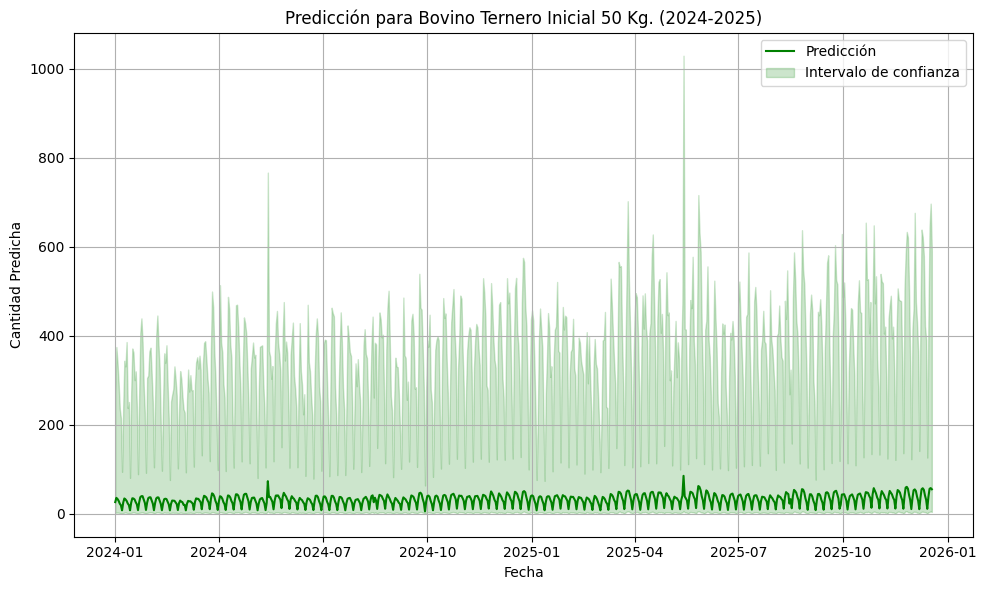

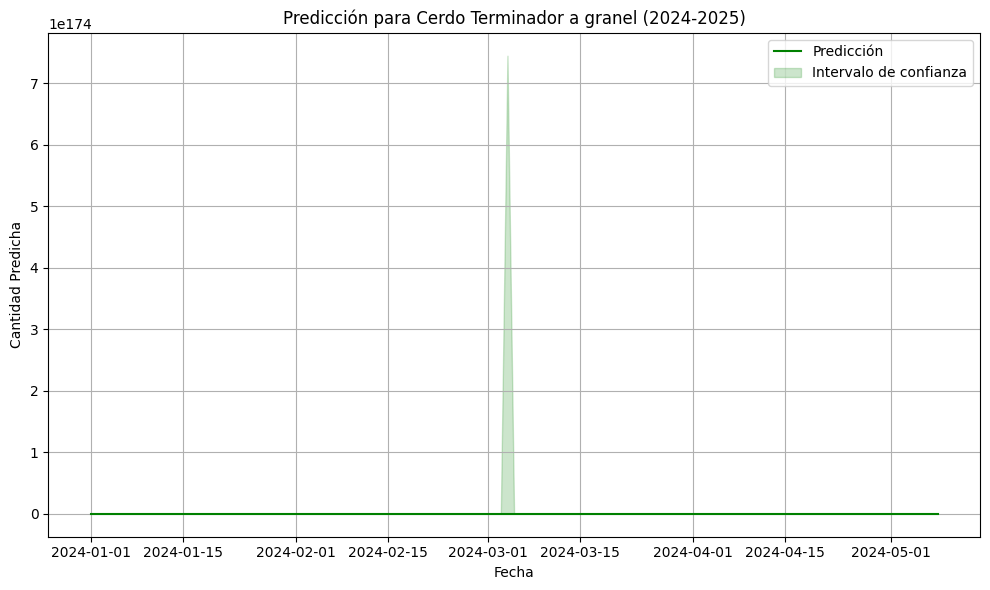

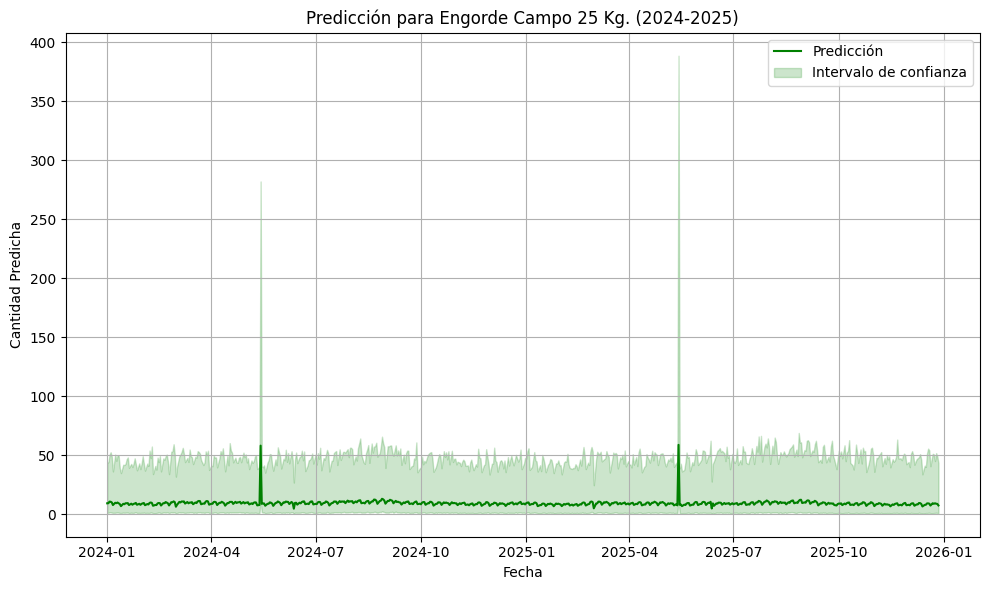

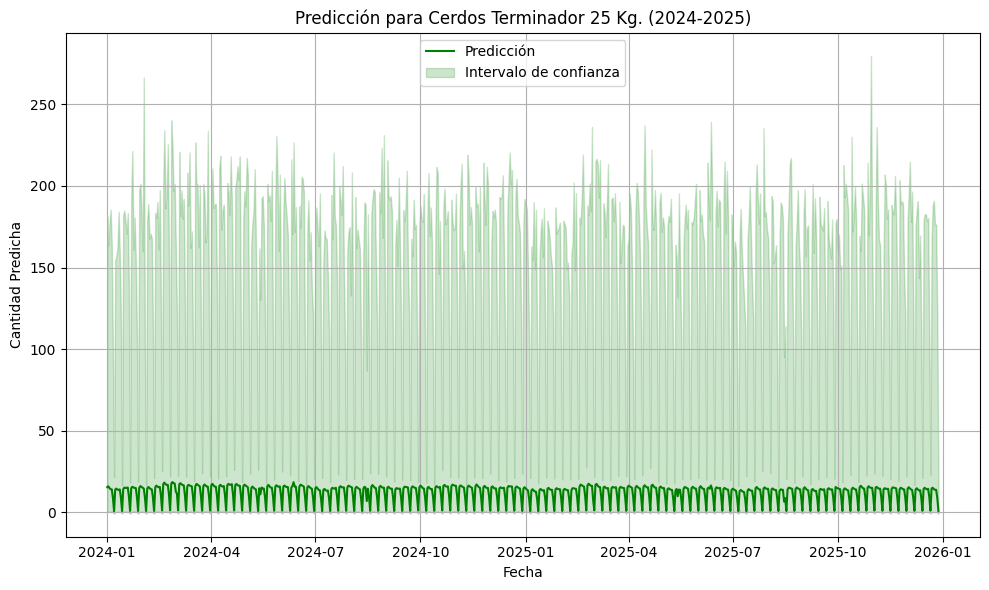

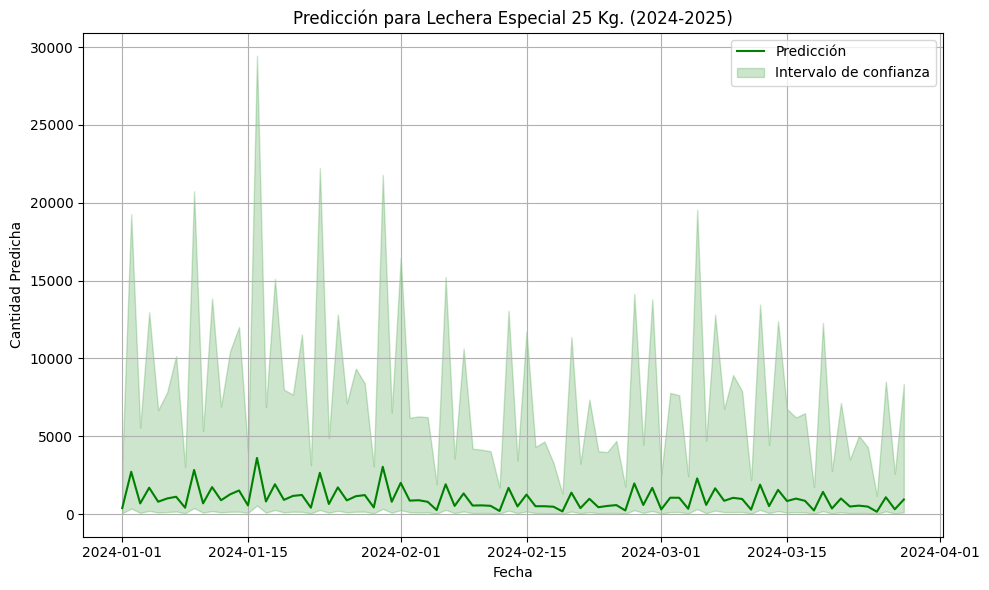

...

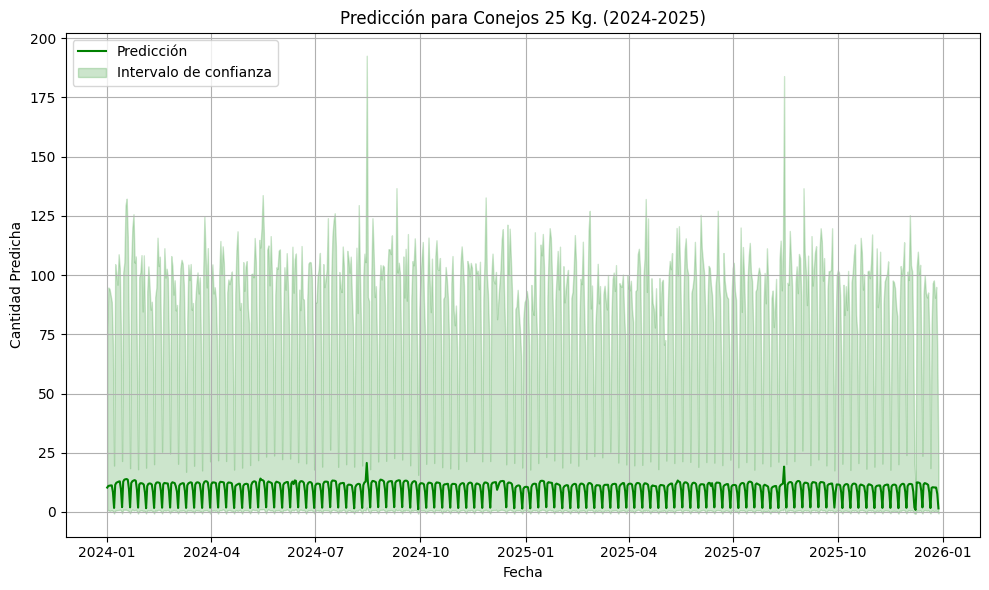

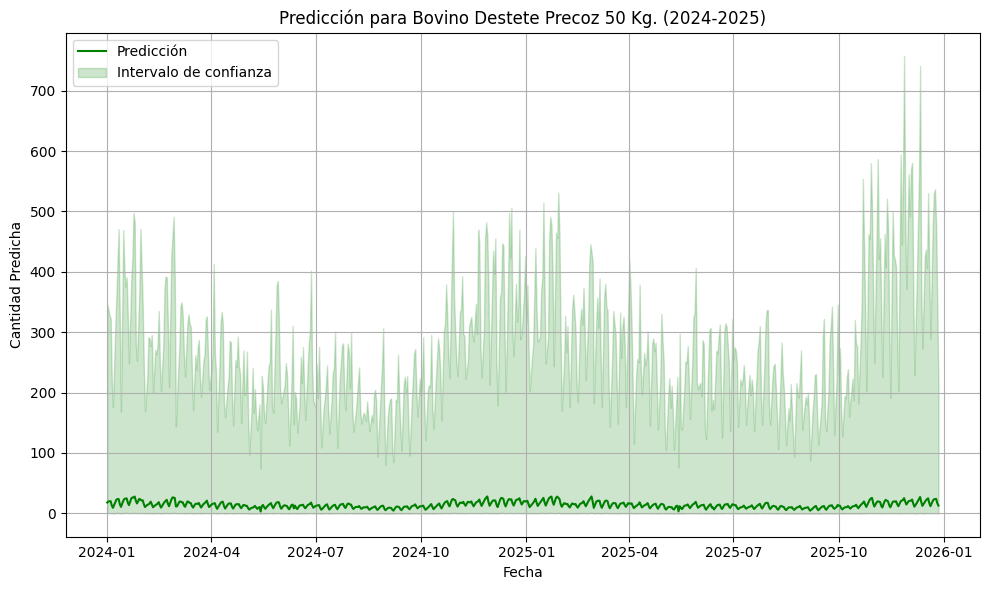

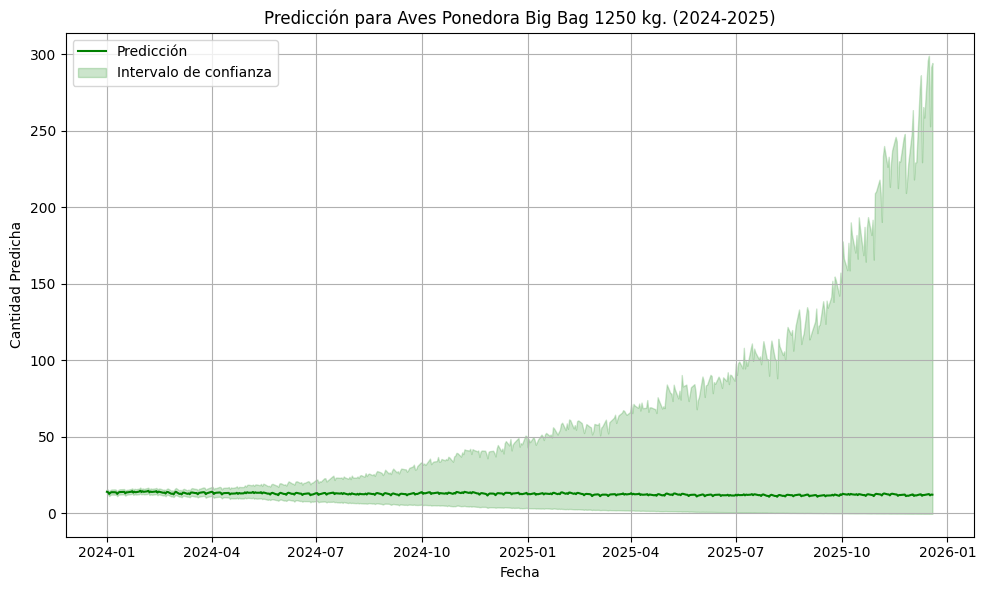

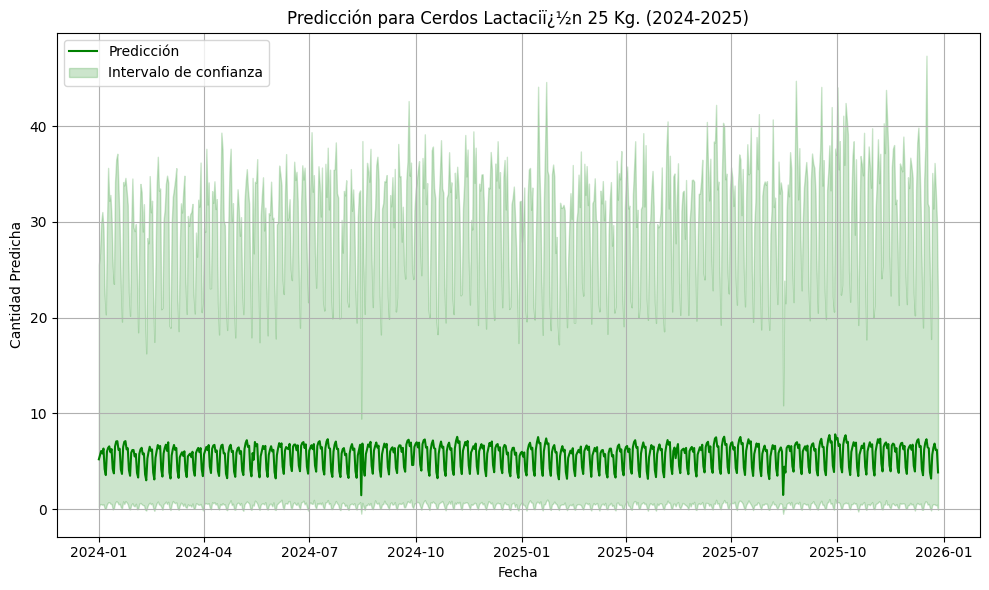

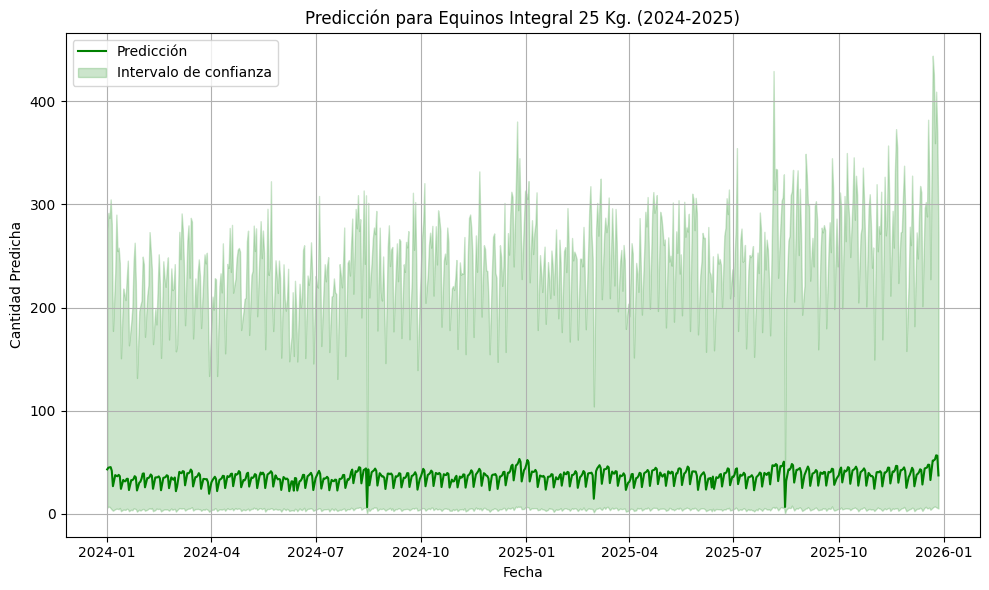

In [60]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Carpeta donde están los archivos filtrados con datos positivos
positive_forecast_dir = "forecast_positivos"

# Lista de archivos positivos
positive_forecast_files = [f for f in os.listdir(positive_forecast_dir) if f.endswith('.csv')]

# Crear gráficos para cada archivo de forecast positivo
for file in positive_forecast_files:
    # Cargar el archivo
    file_path = os.path.join(positive_forecast_dir, file)
    forecast = pd.read_csv(file_path)

    # Convertir la columna 'ds' a datetime
    forecast['ds'] = pd.to_datetime(forecast['ds'])

    # Filtrar los datos para 2024 y 2025
    forecast_2024_2025 = forecast[(forecast['ds'].dt.year >= 2024) & (forecast['ds'].dt.year <= 2025)]

    # Crear el gráfico
    plt.figure(figsize=(10, 6))
    plt.plot(forecast_2024_2025['ds'], forecast_2024_2025['yhat'], label='Predicción', color='green')
    plt.fill_between(forecast_2024_2025['ds'], forecast_2024_2025['yhat_lower'], forecast_2024_2025['yhat_upper'],
                     color='green', alpha=0.2, label='Intervalo de confianza')
    plt.title(f"Predicción para {file.replace('_forecast.csv', '').replace('_', ' ')} (2024-2025)")
    plt.xlabel("Fecha")
    plt.ylabel("Cantidad Predicha")
    plt.legend()
    plt.grid()
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()


In [61]:
import os
import pandas as pd
import numpy as np

# A. Load/Prepare Actual Data
df["FECHA"] = pd.to_datetime(df["FECHA"], format="%d/%m/%Y", errors="coerce")
df_2024 = df[df["FECHA"].dt.year == 2024].copy()
df_2024 = df_2024.rename(columns={"FECHA": "ds", "TOTAL_CANTIDAD": "y"})

# B. Define an Error Function (MAPE)
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    # Filter out cases where y_true == 0 to avoid division by zero
    mask = (y_true != 0)
    y_true = y_true[mask]
    y_pred = y_pred[mask]
    
    if len(y_true) == 0:
        return np.nan
    
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100.0

# C. Iterate Over Forecast Files
positive_forecast_dir = "forecast_positivos"
forecast_files = [f for f in os.listdir(positive_forecast_dir) if f.endswith(".csv")]

results = []

for file in forecast_files:
    # 1) Identify product name
    product_name = file.replace("_forecast.csv", "").replace("_", " ")
    
    # 2) Load forecast
    file_path = os.path.join(positive_forecast_dir, file)
    forecast_df = pd.read_csv(file_path)
    
    # Convert ds to datetime
    forecast_df["ds"] = pd.to_datetime(forecast_df["ds"])
    
    # 3) Filter to 2024
    forecast_2024 = forecast_df[forecast_df["ds"].dt.year == 2024].copy()
    if forecast_2024.empty:
        # If no 2024 forecast rows, skip
        continue
    
    # 4) Actuals for this product in 2024
    df_2024_producto = df_2024[df_2024["DESCRIPCION"] == product_name].copy()
    if df_2024_producto.empty:
        continue
    
    # 5) Merge on ds
    merged_df = pd.merge(
        df_2024_producto[["ds", "y"]], 
        forecast_2024[["ds", "yhat"]], 
        on="ds", 
        how="inner"
    )
    if merged_df.empty:
        continue
    
    # 6) Compute MAPE
    mape_val = mean_absolute_percentage_error(merged_df["y"], merged_df["yhat"])
    
    # 7) Store results
    results.append({
        "producto": product_name,
        "mape_2024": mape_val,
        "n_overlap_days": len(merged_df)
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Remove rows with NaN MAPE
results_df = results_df.dropna(subset=["mape_2024"])

# Sort ascending by MAPE
results_df = results_df.sort_values(by="mape_2024", ascending=True)

# Now pick top 20
top_20 = results_df.head(20)

print("=== Top 20 Productos con menor error (MAPE) en 2024 ===")
print(top_20)

# (Optional) Save to CSV
top_20.to_csv("top_20_best_products_2024.csv", index=False)


=== Top 20 Productos con menor error (MAPE) en 2024 ===
                                             producto     mape_2024  \
27  Pez Crecimiento Plus 32% (3-5mm) - Big Bag 750 Kg  2.220446e-14   
54                     Aves Ponedora Big Bag 1250 kg.  1.090631e+01   
34                Lecheras A.P. 22% Big Bag 1.250 Kg.  7.591663e+01   
20                          Lecheras A.P. 20% - 25 Kg  8.152937e+01   
37                          Cerdos Gestaciï¿½n 25 Kg.  8.255928e+01   
24                            Cerdos Iniciador 25 Kg.  9.507007e+01   
41                         Lecheras A.P. 18% - 25 Kg.  9.541792e+01   
15                                    Avestruz 25 Kg.  1.003869e+02   
48          Lactomix AP HIGH PROTEIN-Big Bag 1.250 Kg  1.033636e+02   
13                    Pez Alevines 40% Polvo - 25 Kg.  1.087430e+02   
11                            Desmamante Campo 25 Kg.  1.099111e+02   
29                         Lecheras A.P. 18% - 50 Kg.  1.106871e+02   
42                   

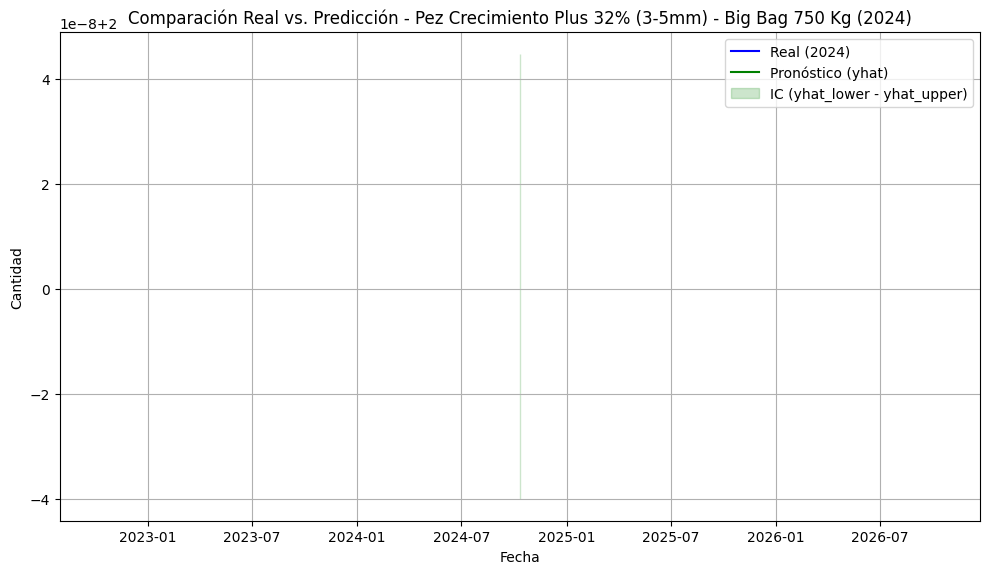

[INFO] CSV de comparación guardado en: Pez_Crecimiento_Plus_32%_(3-5mm)_-_Big_Bag_750_Kg_comparacion_2024.csv


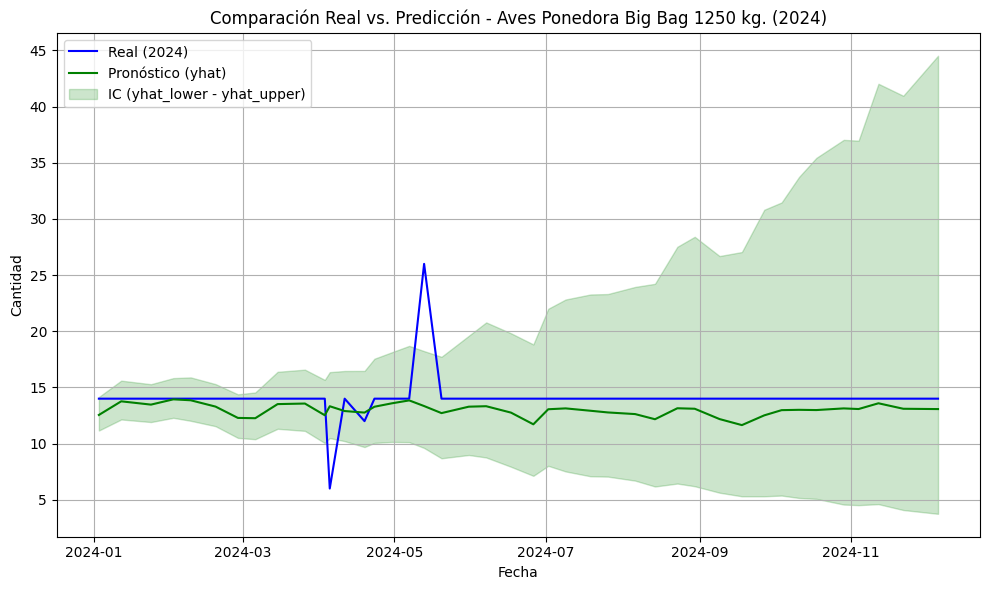

[INFO] CSV de comparación guardado en: Aves_Ponedora_Big_Bag_1250_kg._comparacion_2024.csv


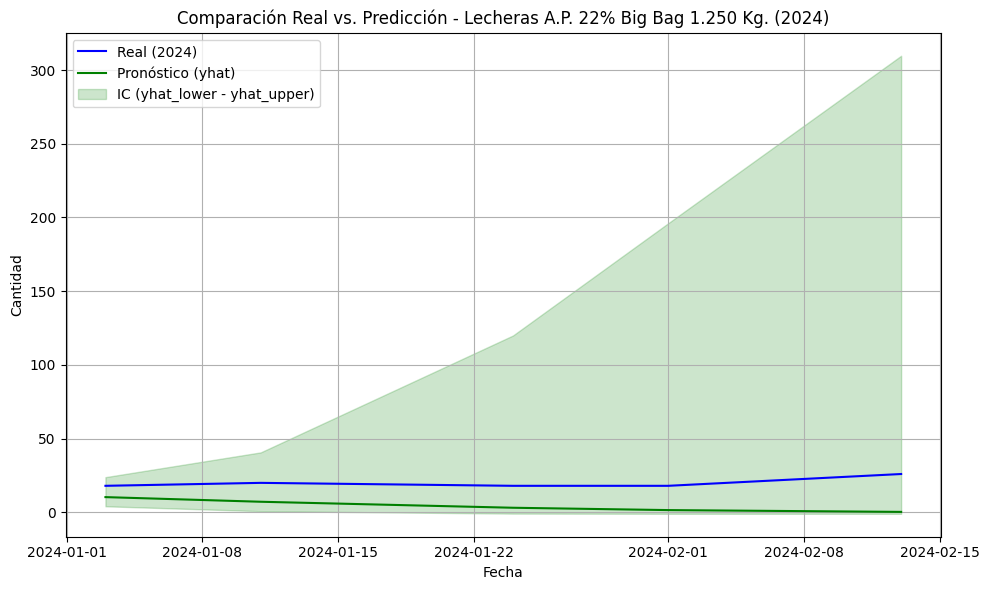

[INFO] CSV de comparación guardado en: Lecheras_A.P._22%_Big_Bag_1.250_Kg._comparacion_2024.csv


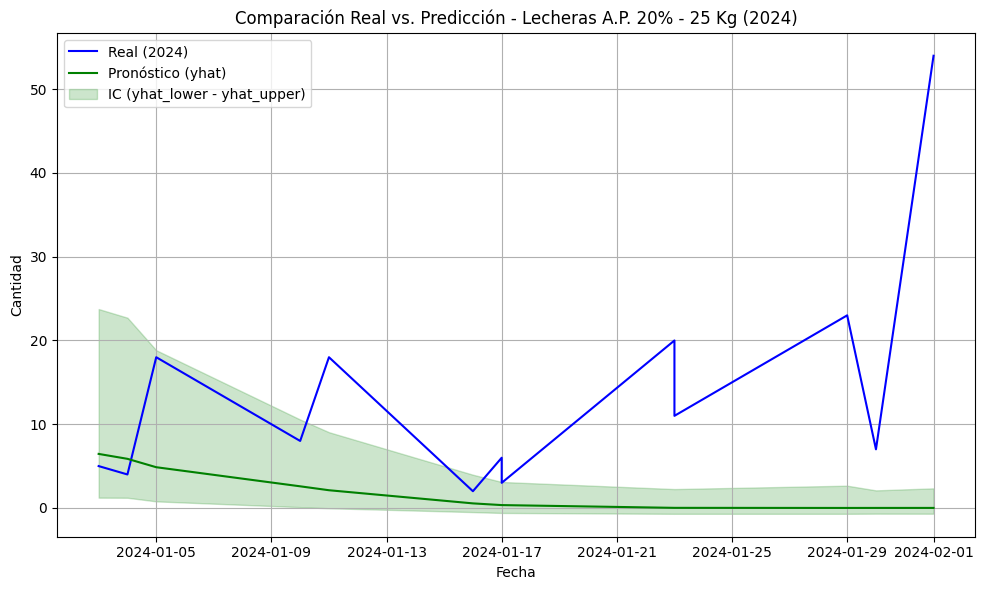

[INFO] CSV de comparación guardado en: Lecheras_A.P._20%_-_25_Kg_comparacion_2024.csv


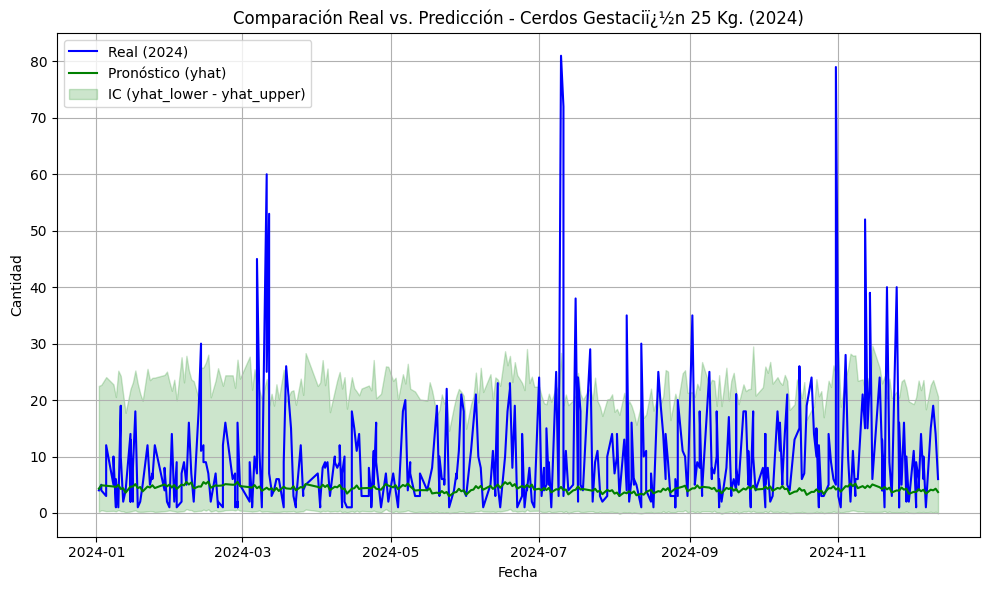

[INFO] CSV de comparación guardado en: Cerdos_Gestaciï¿½n_25_Kg._comparacion_2024.csv


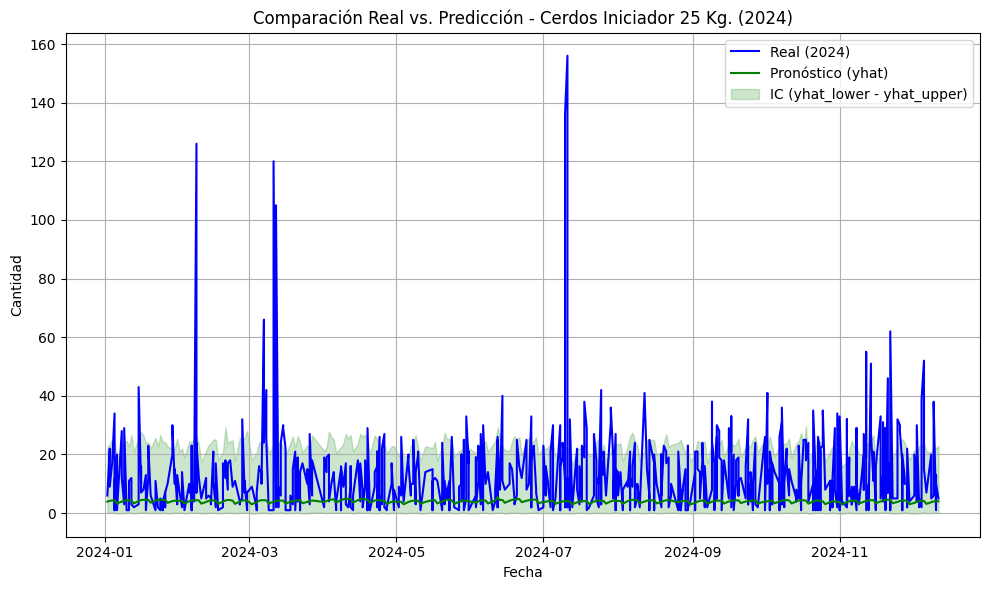

[INFO] CSV de comparación guardado en: Cerdos_Iniciador_25_Kg._comparacion_2024.csv


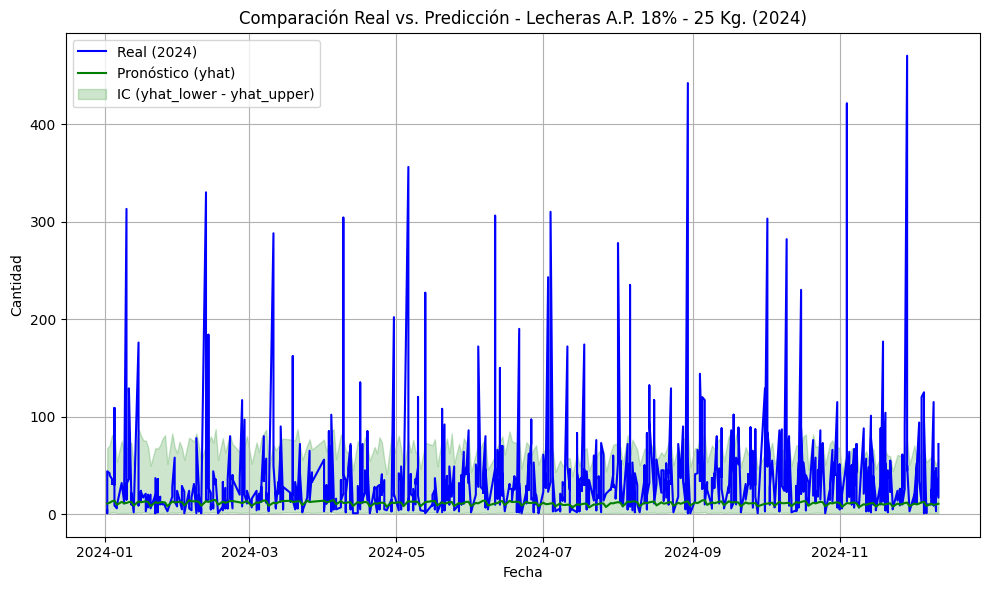

[INFO] CSV de comparación guardado en: Lecheras_A.P._18%_-_25_Kg._comparacion_2024.csv


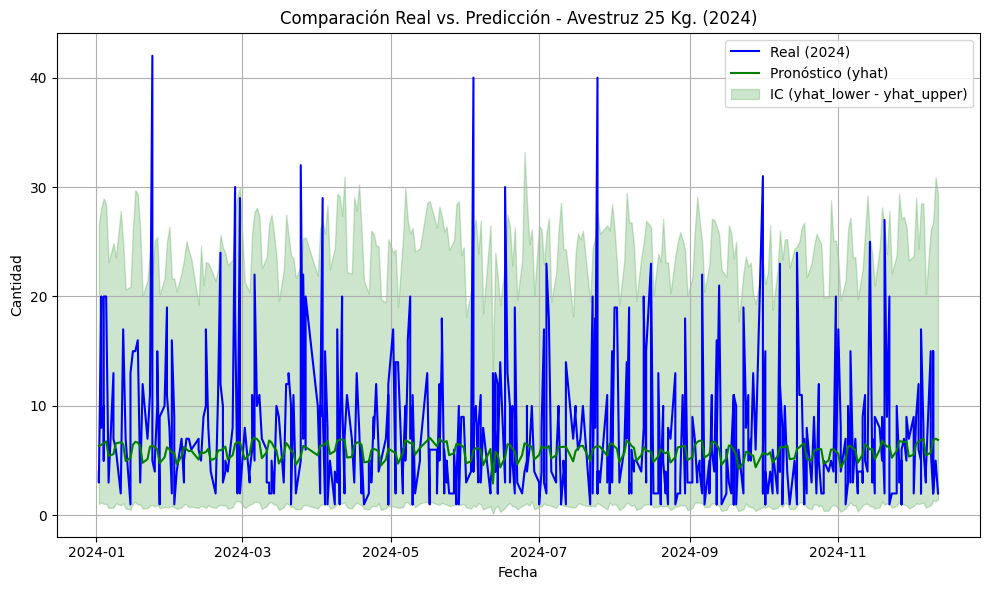

[INFO] CSV de comparación guardado en: Avestruz_25_Kg._comparacion_2024.csv


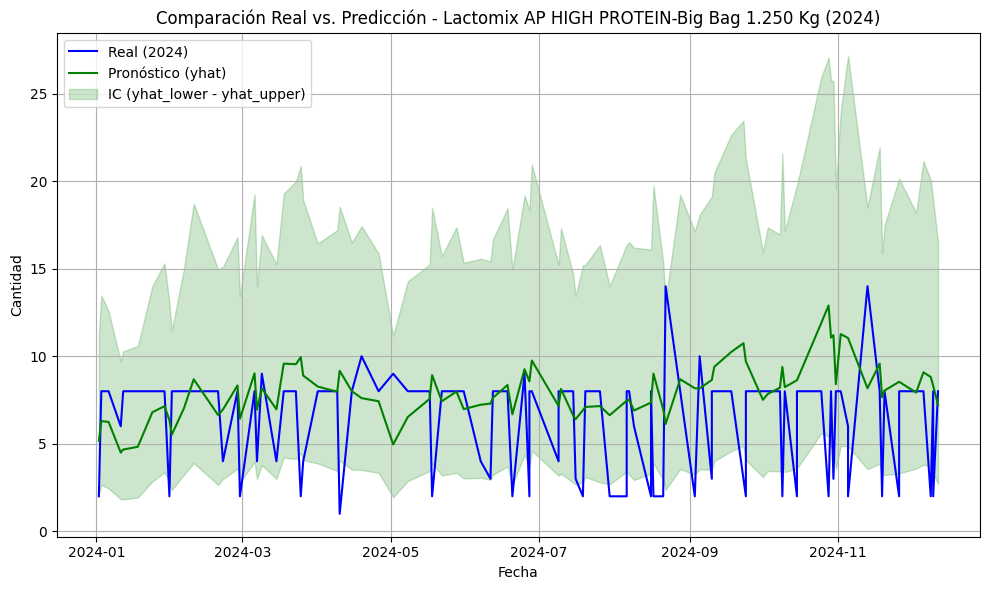

[INFO] CSV de comparación guardado en: Lactomix_AP_HIGH_PROTEIN-Big_Bag_1.250_Kg_comparacion_2024.csv


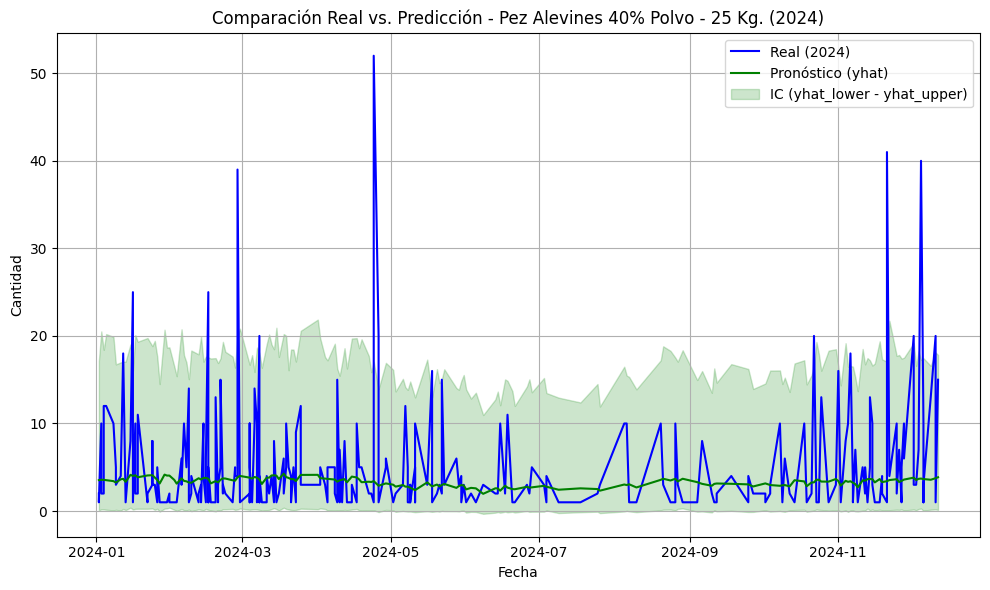

[INFO] CSV de comparación guardado en: Pez_Alevines_40%_Polvo_-_25_Kg._comparacion_2024.csv


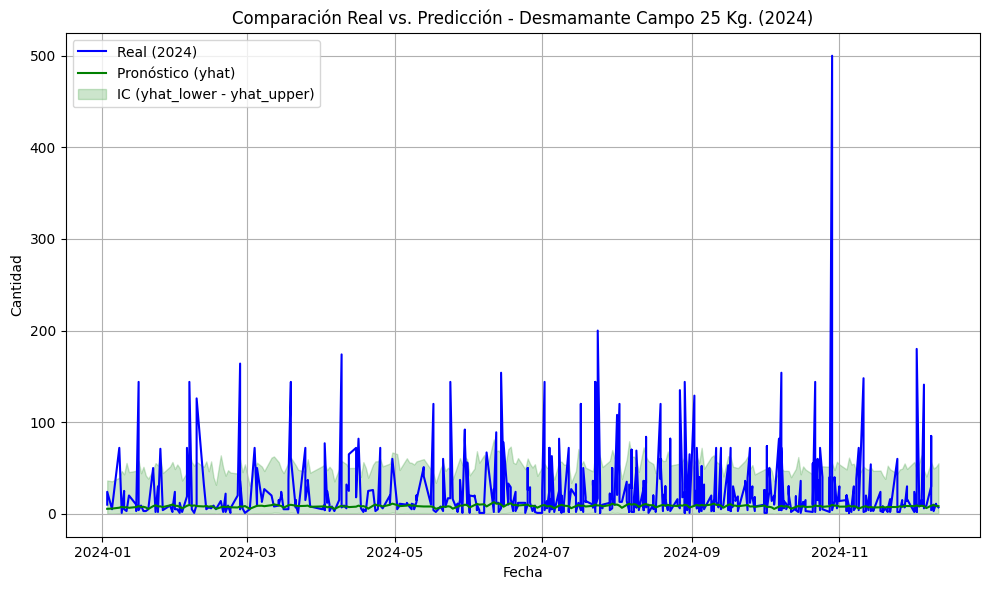

[INFO] CSV de comparación guardado en: Desmamante_Campo_25_Kg._comparacion_2024.csv


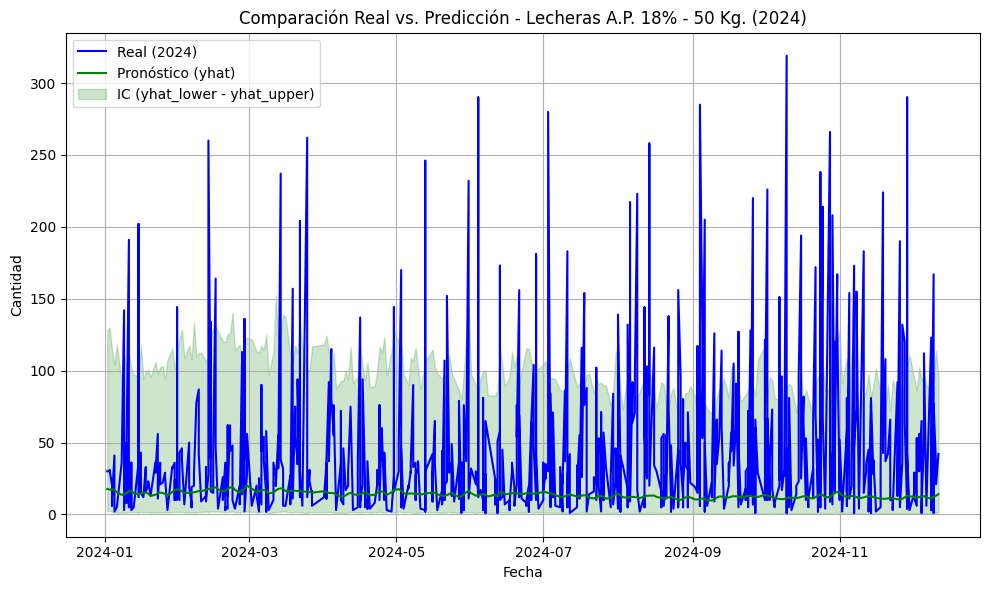

[INFO] CSV de comparación guardado en: Lecheras_A.P._18%_-_50_Kg._comparacion_2024.csv


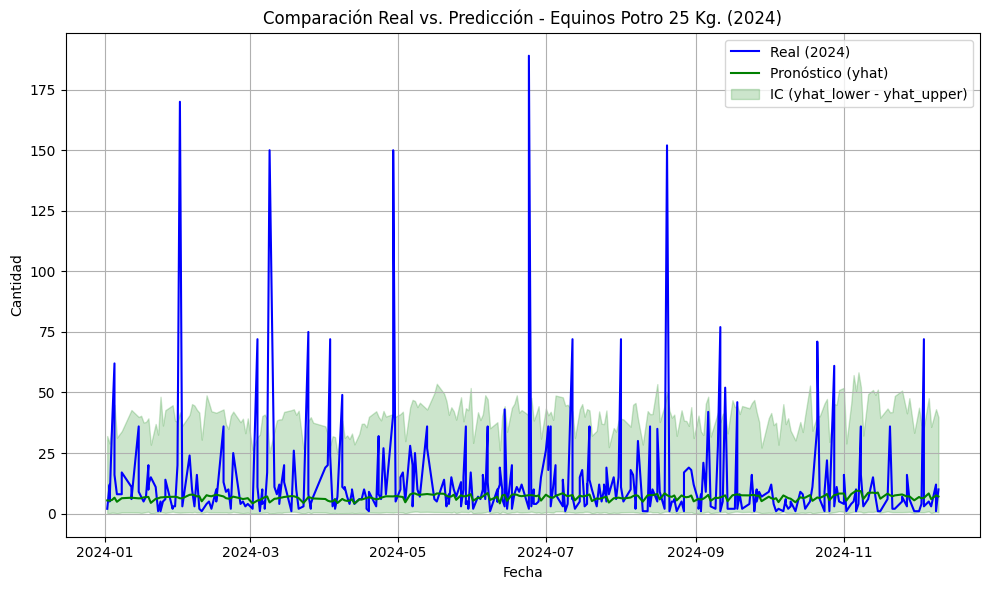

[INFO] CSV de comparación guardado en: Equinos_Potro_25_Kg._comparacion_2024.csv


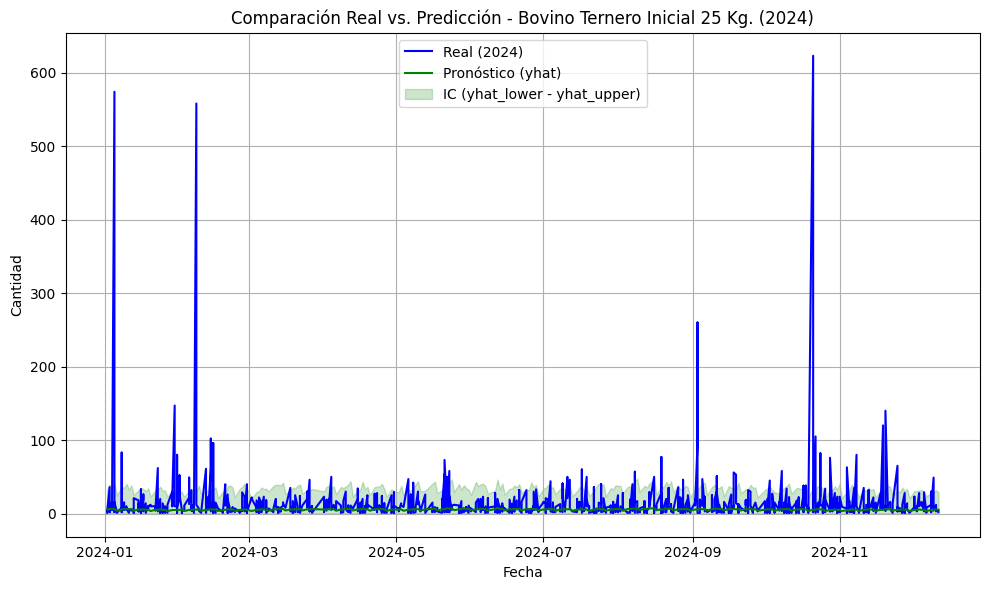

[INFO] CSV de comparación guardado en: Bovino_Ternero_Inicial_25_Kg._comparacion_2024.csv


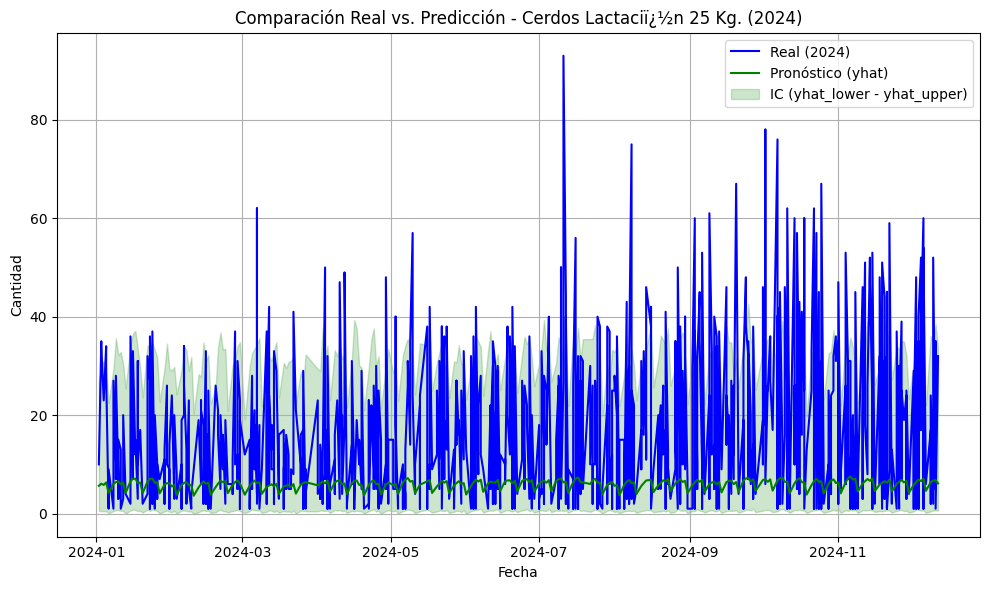

[INFO] CSV de comparación guardado en: Cerdos_Lactaciï¿½n_25_Kg._comparacion_2024.csv


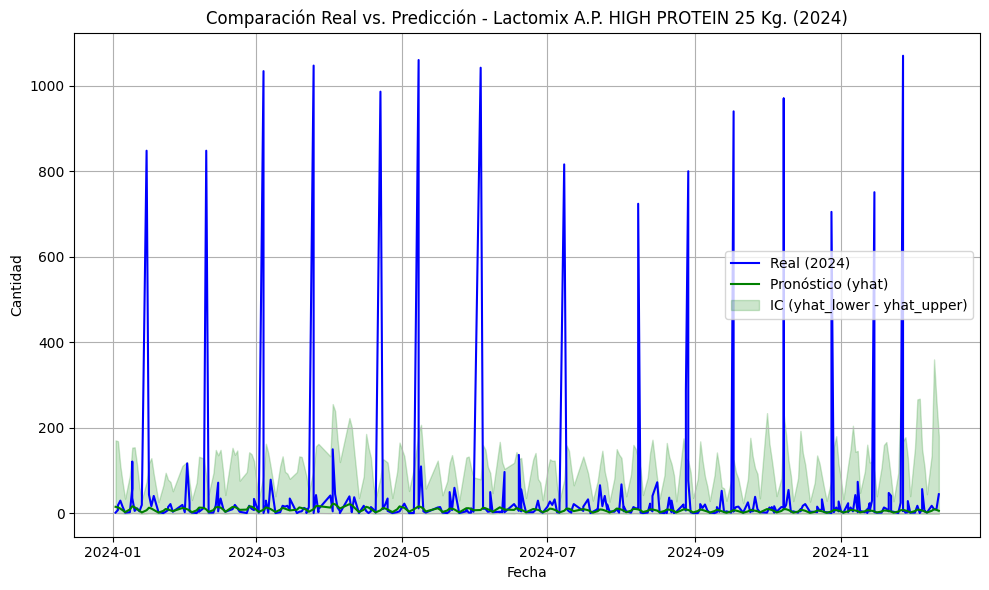

[INFO] CSV de comparación guardado en: Lactomix_A.P._HIGH_PROTEIN_25_Kg._comparacion_2024.csv


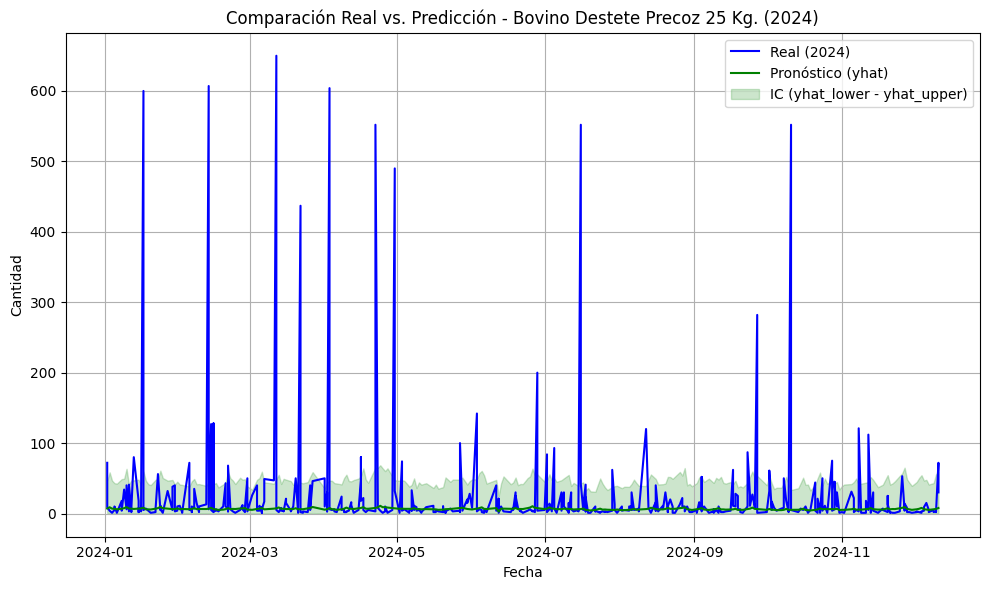

[INFO] CSV de comparación guardado en: Bovino_Destete_Precoz_25_Kg._comparacion_2024.csv


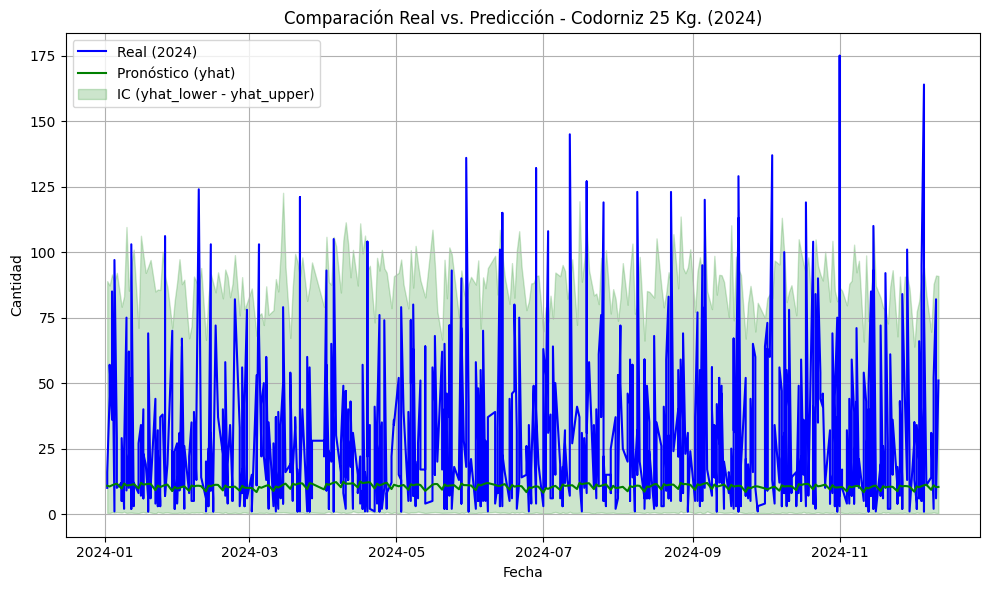

[INFO] CSV de comparación guardado en: Codorniz_25_Kg._comparacion_2024.csv


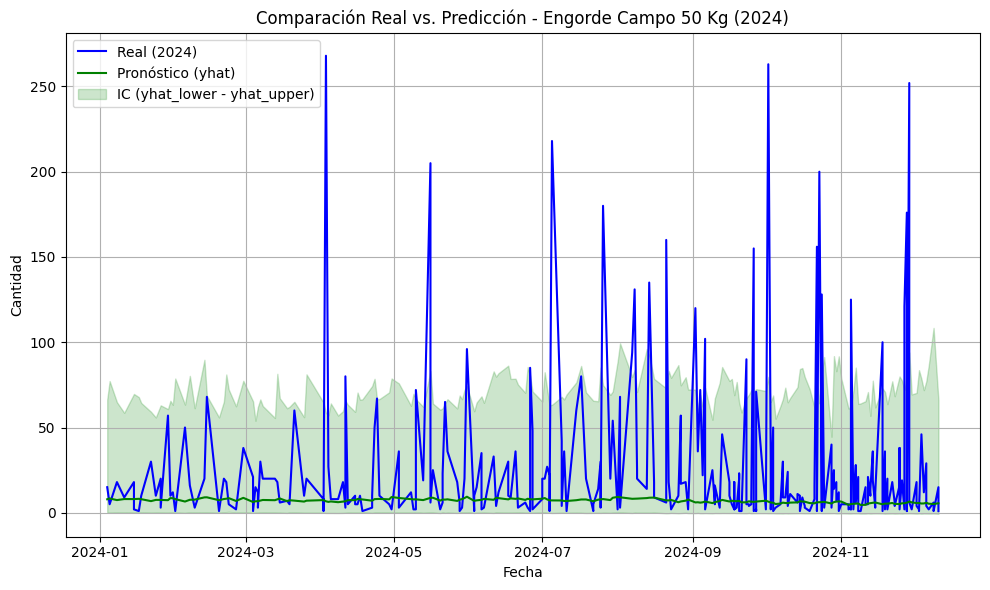

[INFO] CSV de comparación guardado en: Engorde_Campo_50_Kg_comparacion_2024.csv


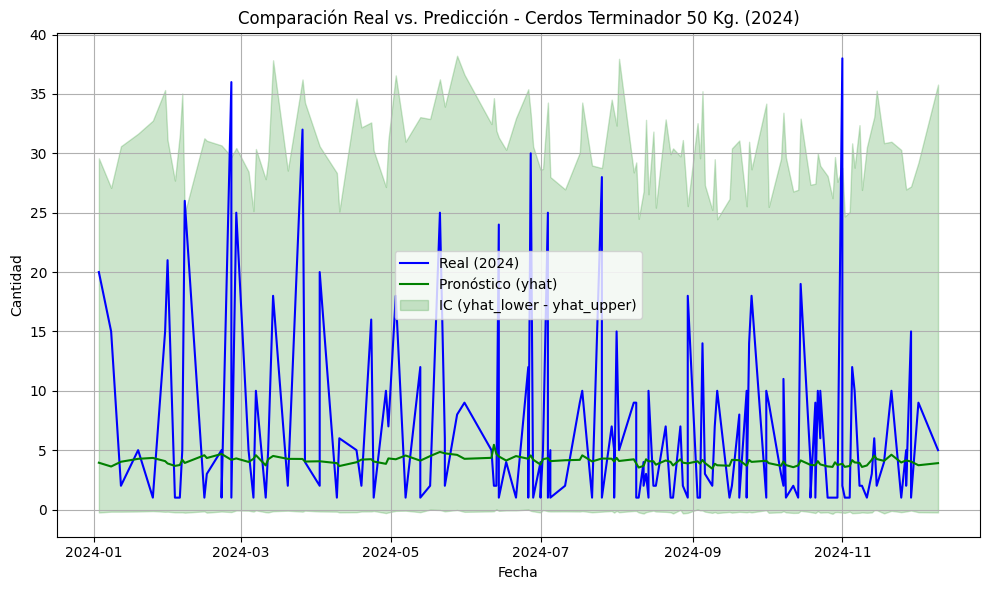

[INFO] CSV de comparación guardado en: Cerdos_Terminador_50_Kg._comparacion_2024.csv


In [62]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------------------------
# 1) Crear la carpeta "mejores_productos" (para guardar únicamente los CSV)
# ---------------------------------------------------------------------
best_products_dir = "mejores_productos"
os.makedirs(best_products_dir, exist_ok=True)

# ---------------------------------------------------------------------
# 2) Asegurar que df tenga FECHA como datetime y filtrar data del 2024
# ---------------------------------------------------------------------
df["FECHA"] = pd.to_datetime(df["FECHA"], format="%d/%m/%Y", errors="coerce")

df_2024 = df[df["FECHA"].dt.year == 2024].copy()
df_2024.rename(columns={"FECHA": "ds", "TOTAL_CANTIDAD": "y"}, inplace=True)

# ---------------------------------------------------------------------
# 3) top_20: DataFrame con las 20 filas (productos) con mejor resultado
#    Debe tener una columna "producto" que coincida con DESCRIPCION en df
# ---------------------------------------------------------------------
# Ejemplo (ya definido en tu script anterior):
# top_20 = pd.DataFrame({
#     "producto": ["Producto A", "Producto B", ...],
#     "mape_2024": [10.5, 11.2, ...]
# })

# ---------------------------------------------------------------------
# 4) Ubicación de los forecasts con valores positivos
# ---------------------------------------------------------------------
positive_forecast_dir = "forecast_positivos"

# ---------------------------------------------------------------------
# 5) Iterar sobre cada producto en top_20
# ---------------------------------------------------------------------
for idx, row in top_20.iterrows():
    product_name = row["producto"]
    
    # Generar el nombre de archivo: "Producto A" -> "Producto_A_forecast.csv"
    forecast_filename = product_name.replace(" ", "_") + "_forecast.csv"
    forecast_path = os.path.join(positive_forecast_dir, forecast_filename)
    
    # Verificar si existe ese archivo
    if not os.path.exists(forecast_path):
        print(f"[AVISO] No se encontró forecast para '{product_name}'. Se omite.")
        continue
    
    # 6) Cargar forecast
    forecast_df = pd.read_csv(forecast_path)
    forecast_df["ds"] = pd.to_datetime(forecast_df["ds"])
    
    # Filtrar a datos de 2024
    forecast_2024 = forecast_df[forecast_df["ds"].dt.year == 2024].copy()
    if forecast_2024.empty:
        print(f"[INFO] Forecast de 2024 vacío para '{product_name}'. Se omite.")
        continue
    
    # 7) Obtener datos reales de df_2024 para este producto
    df_2024_producto = df_2024[df_2024["DESCRIPCION"] == product_name].copy()
    if df_2024_producto.empty:
        print(f"[INFO] No hay datos reales 2024 para '{product_name}'. Se omite.")
        continue
    
    # (Opcional) Calcular precio promedio del 2024 si existe la columna
    if "PRECIO_UNITARIO" in df_2024_producto.columns:
        avg_price = df_2024_producto["PRECIO_UNITARIO"].mean()
    else:
        avg_price = np.nan
    
    # 8) Hacer el merge (fechas en común)
    merged_df = pd.merge(
        df_2024_producto[["ds", "y"]], 
        forecast_2024[["ds", "yhat", "yhat_lower", "yhat_upper"]], 
        how="inner",
        on="ds"
    )
    if merged_df.empty:
        print(f"[INFO] No hay fechas solapadas para '{product_name}'. Se omite.")
        continue
    
    merged_df["producto"] = product_name
    merged_df["precio_promedio_2024"] = avg_price
    
    merged_df.sort_values(by="ds", inplace=True)

    # 9) Graficar (mostrar inline, no guardar PNG)
    plt.figure(figsize=(10, 6))
    
    # Datos reales en azul
    plt.plot(merged_df["ds"], merged_df["y"], label="Real (2024)", color="blue")
    
    # Pronóstico en verde
    plt.plot(merged_df["ds"], merged_df["yhat"], label="Pronóstico (yhat)", color="green")
    
    # Banda de confianza
    plt.fill_between(
        merged_df["ds"],
        merged_df["yhat_lower"],
        merged_df["yhat_upper"],
        color="green",
        alpha=0.2,
        label="IC (yhat_lower - yhat_upper)"
    )
    
    # Detalles de la gráfica
    plt.title(f"Comparación Real vs. Predicción - {product_name} (2024)")
    plt.xlabel("Fecha")
    plt.ylabel("Cantidad")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    
    # Mostrar la gráfica en el output
    plt.show()
    
    # 10) Guardar CSV de comparación en "mejores_productos"
    csv_filename = product_name.replace(" ", "_") + "_comparacion_2024.csv"
    csv_path = os.path.join(best_products_dir, csv_filename)
    merged_df.to_csv(csv_path, index=False)
    
    print(f"[INFO] CSV de comparación guardado en: {csv_filename}")


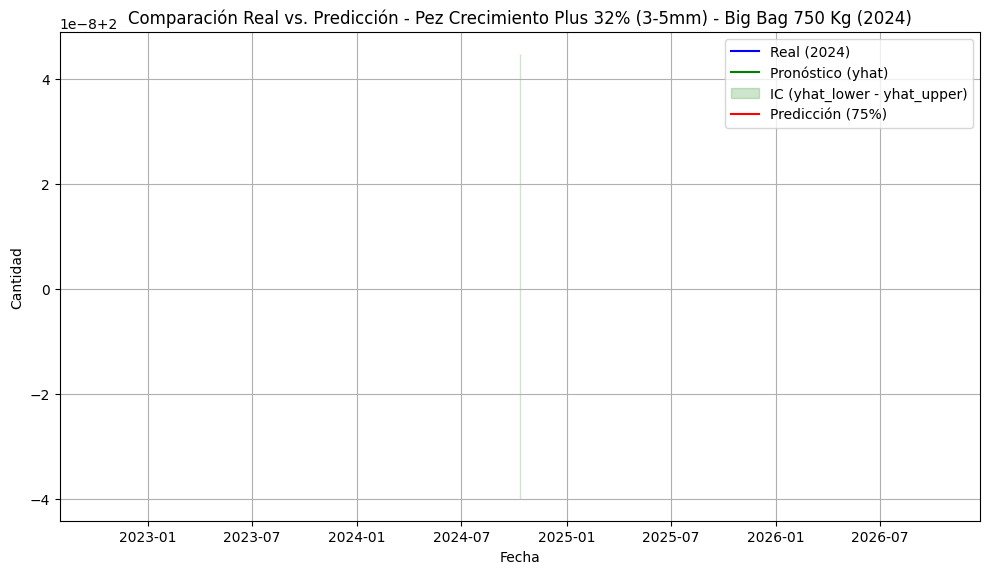

[INFO] CSV de comparación guardado en: Pez_Crecimiento_Plus_32%_(3-5mm)_-_Big_Bag_750_Kg_comparacion_2024.csv


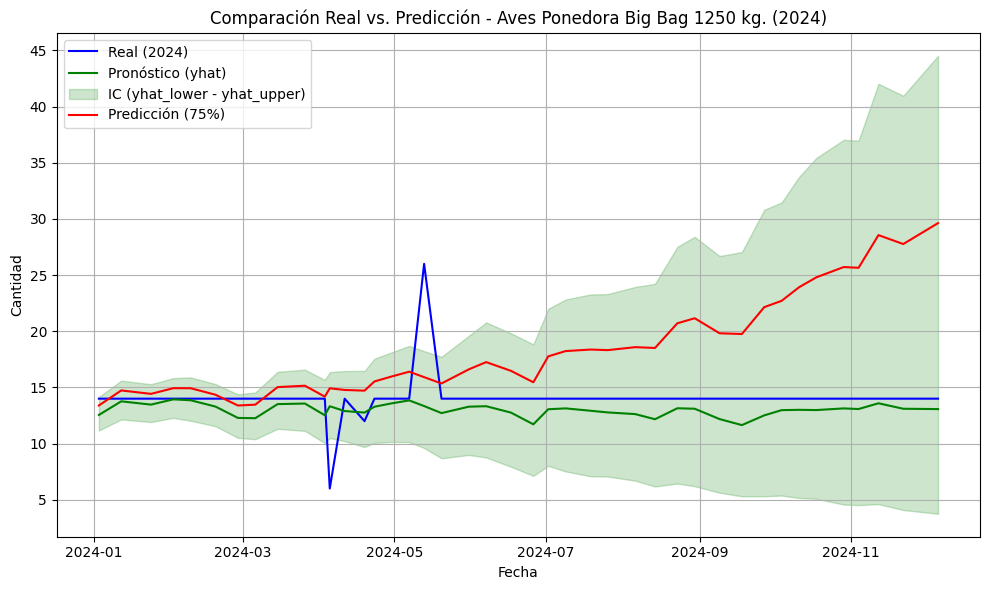

[INFO] CSV de comparación guardado en: Aves_Ponedora_Big_Bag_1250_kg._comparacion_2024.csv


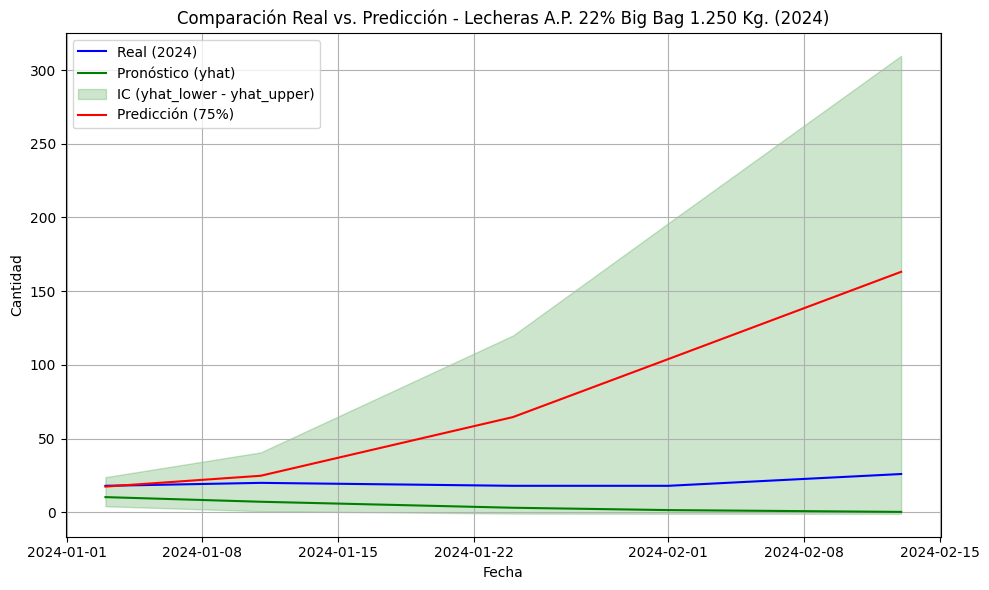

[INFO] CSV de comparación guardado en: Lecheras_A.P._22%_Big_Bag_1.250_Kg._comparacion_2024.csv


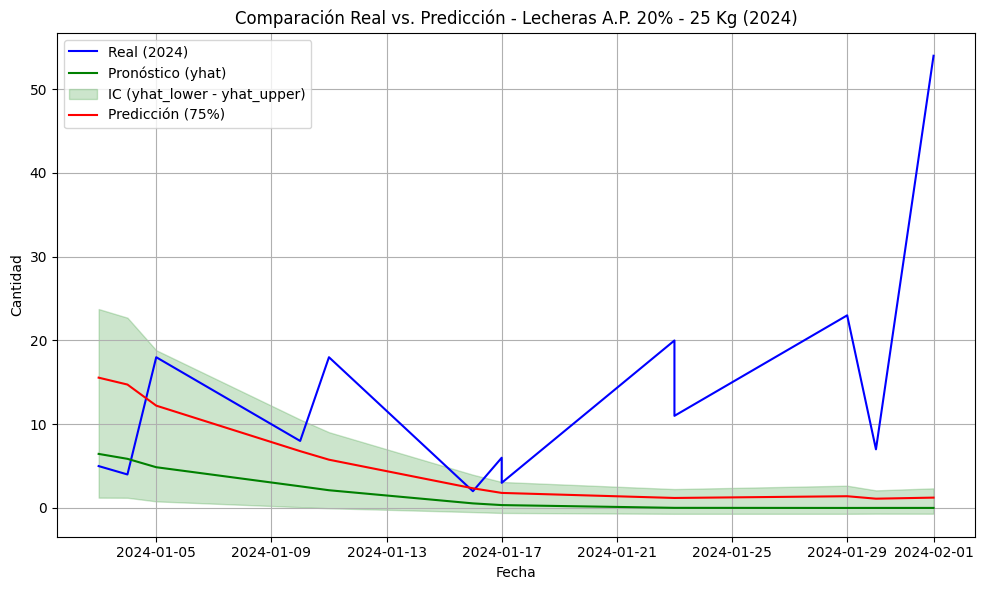

[INFO] CSV de comparación guardado en: Lecheras_A.P._20%_-_25_Kg_comparacion_2024.csv


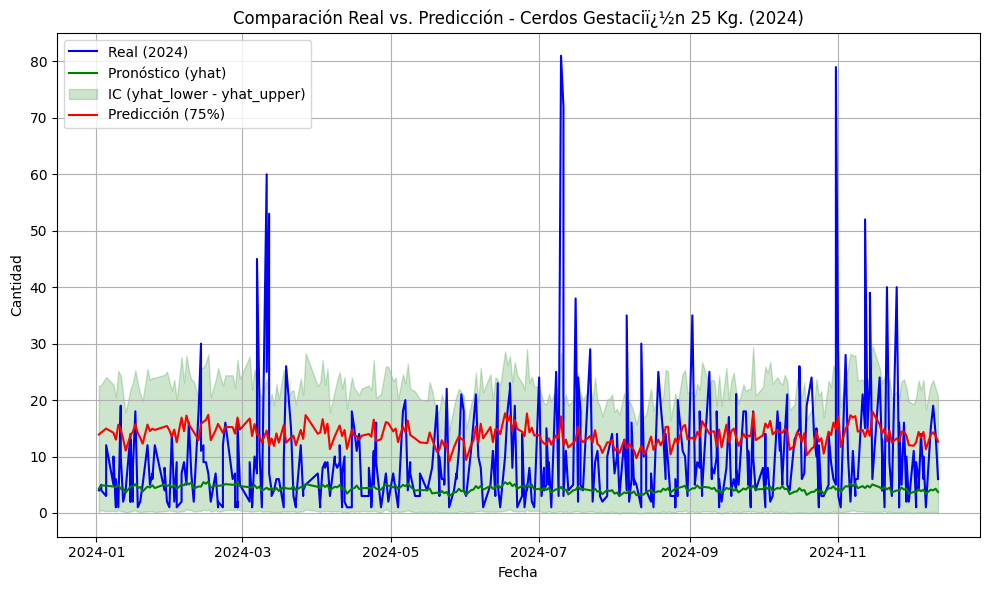

[INFO] CSV de comparación guardado en: Cerdos_Gestaciï¿½n_25_Kg._comparacion_2024.csv


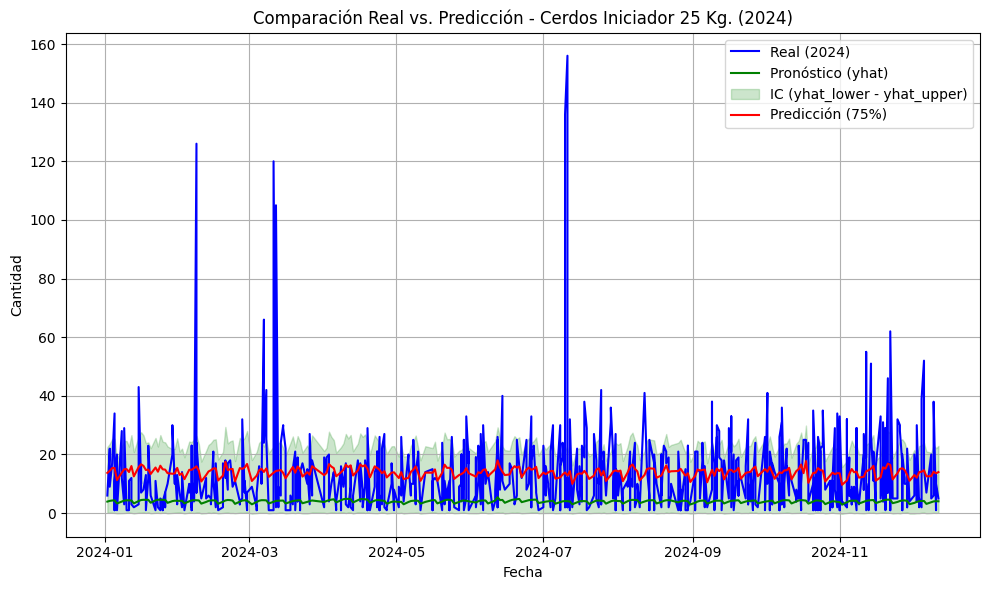

[INFO] CSV de comparación guardado en: Cerdos_Iniciador_25_Kg._comparacion_2024.csv


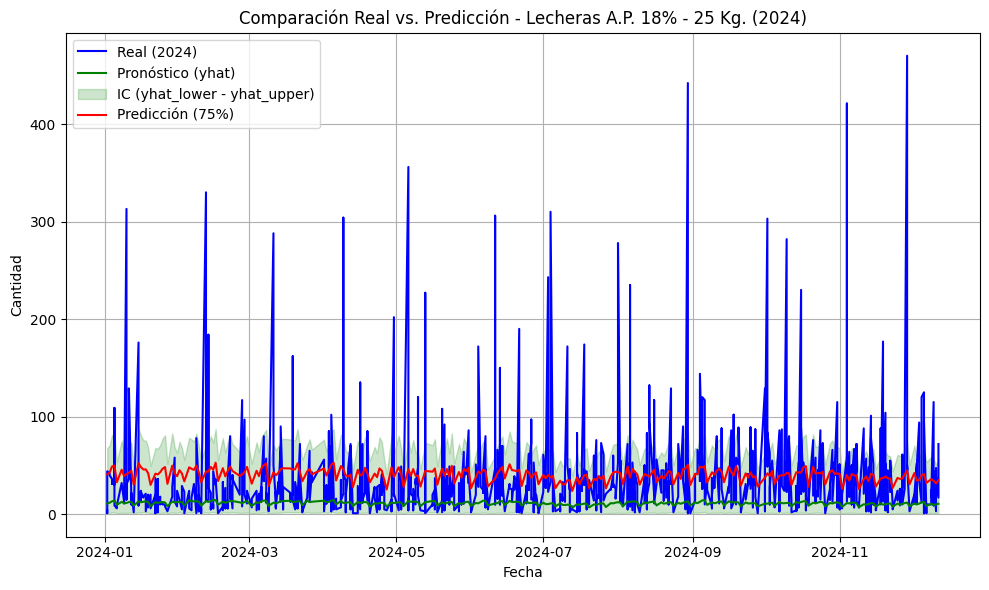

[INFO] CSV de comparación guardado en: Lecheras_A.P._18%_-_25_Kg._comparacion_2024.csv


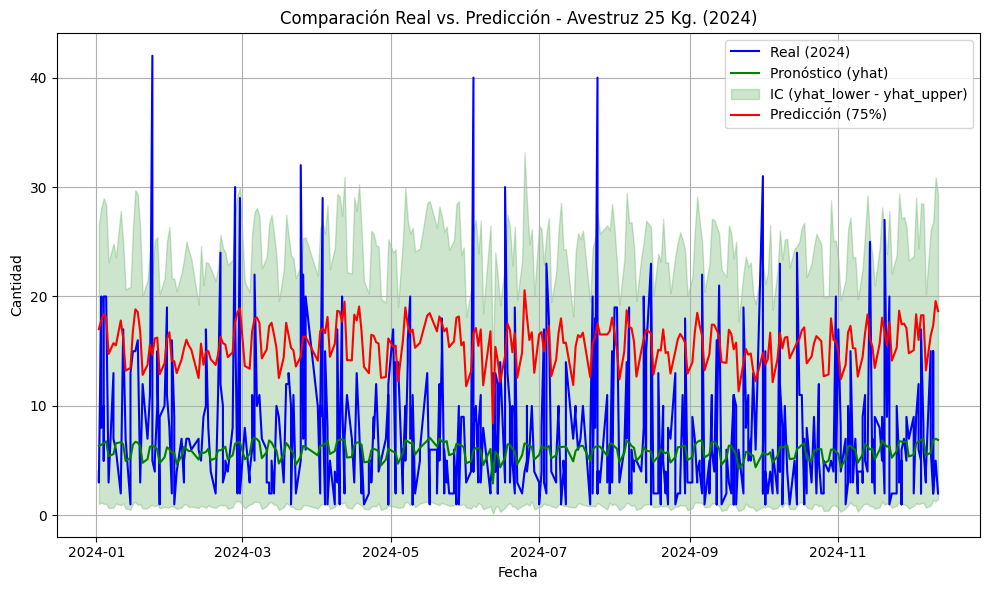

[INFO] CSV de comparación guardado en: Avestruz_25_Kg._comparacion_2024.csv


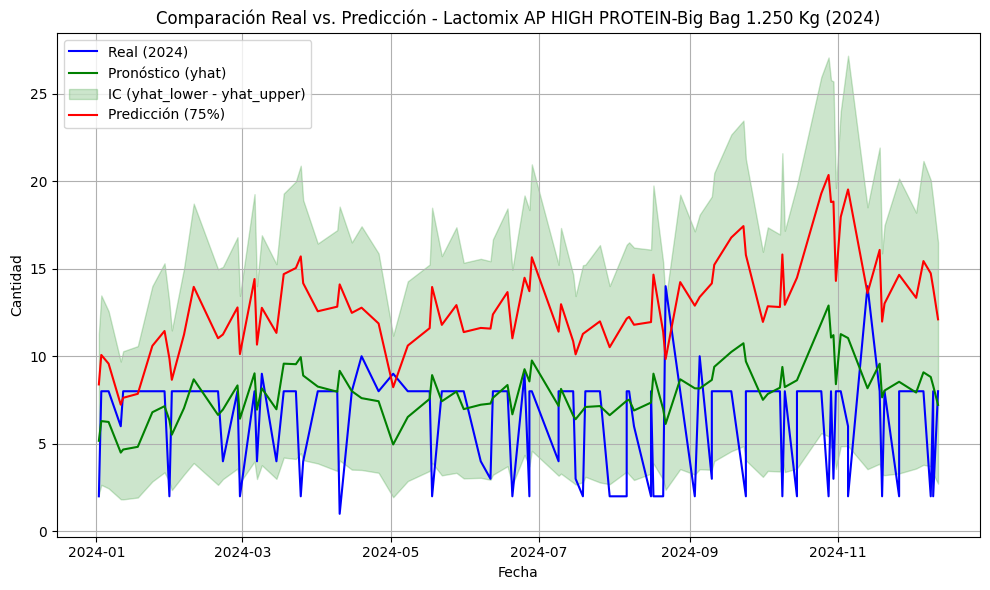

[INFO] CSV de comparación guardado en: Lactomix_AP_HIGH_PROTEIN-Big_Bag_1.250_Kg_comparacion_2024.csv


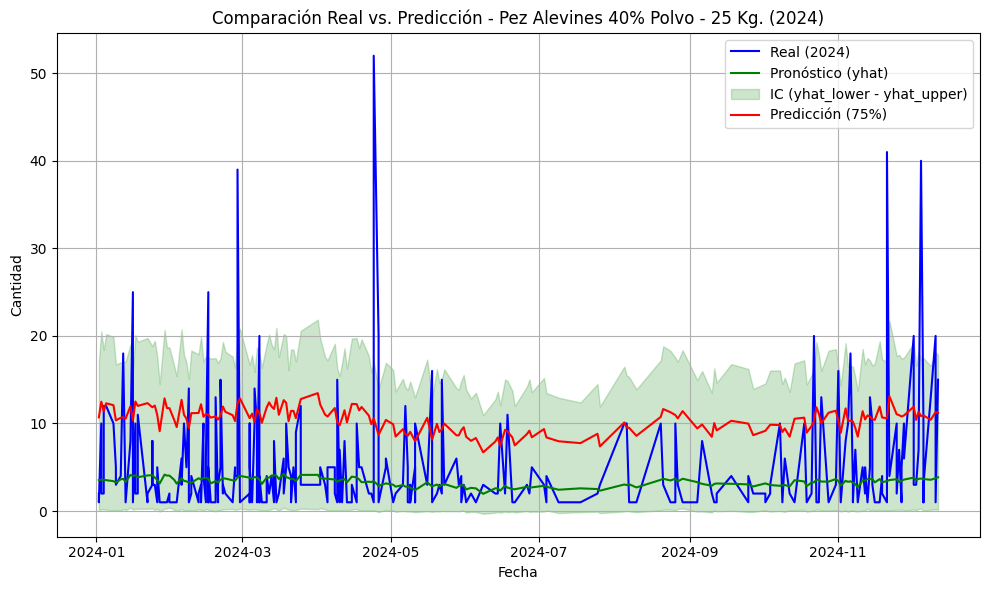

[INFO] CSV de comparación guardado en: Pez_Alevines_40%_Polvo_-_25_Kg._comparacion_2024.csv


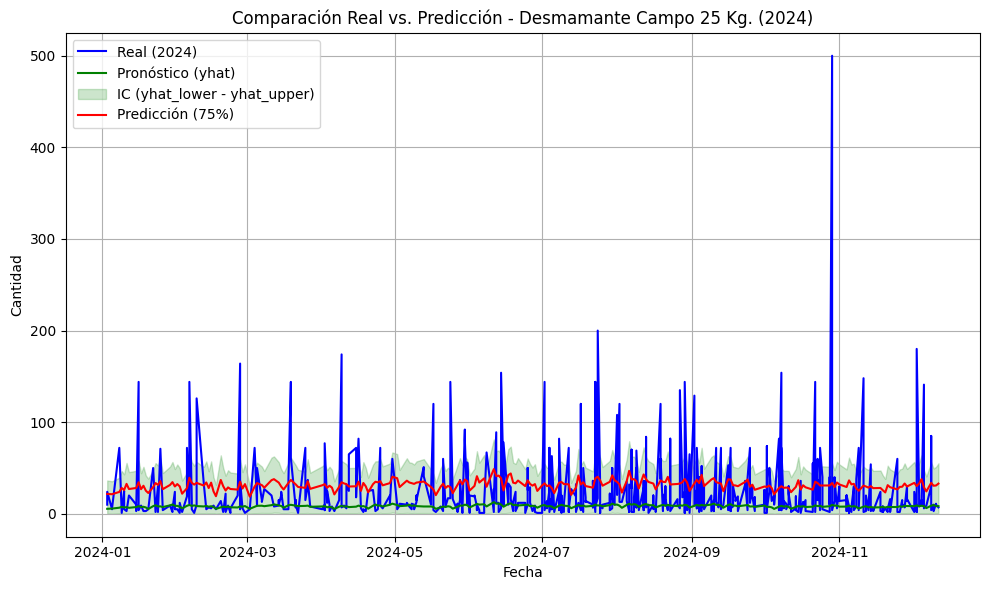

[INFO] CSV de comparación guardado en: Desmamante_Campo_25_Kg._comparacion_2024.csv


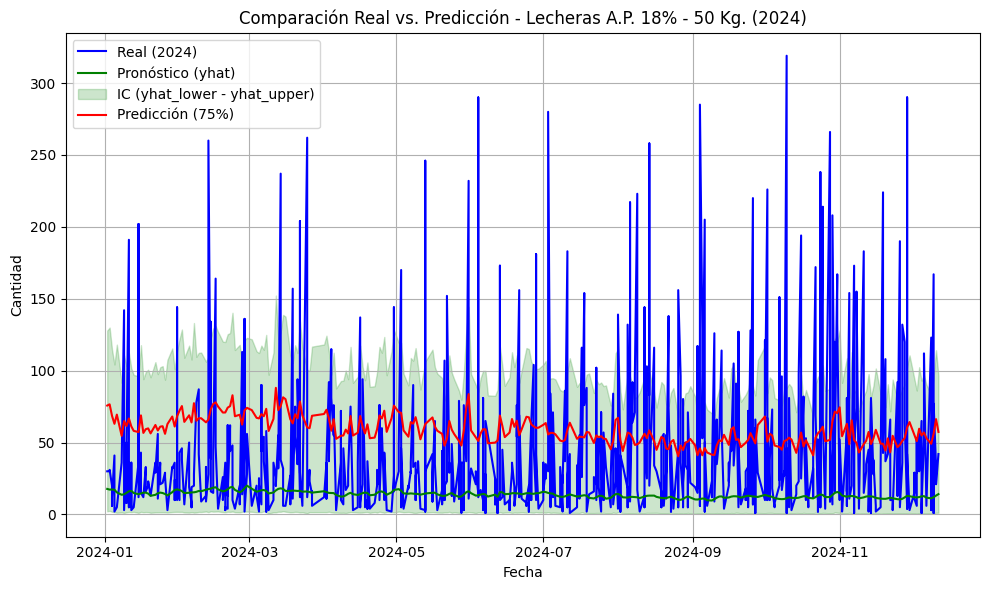

[INFO] CSV de comparación guardado en: Lecheras_A.P._18%_-_50_Kg._comparacion_2024.csv


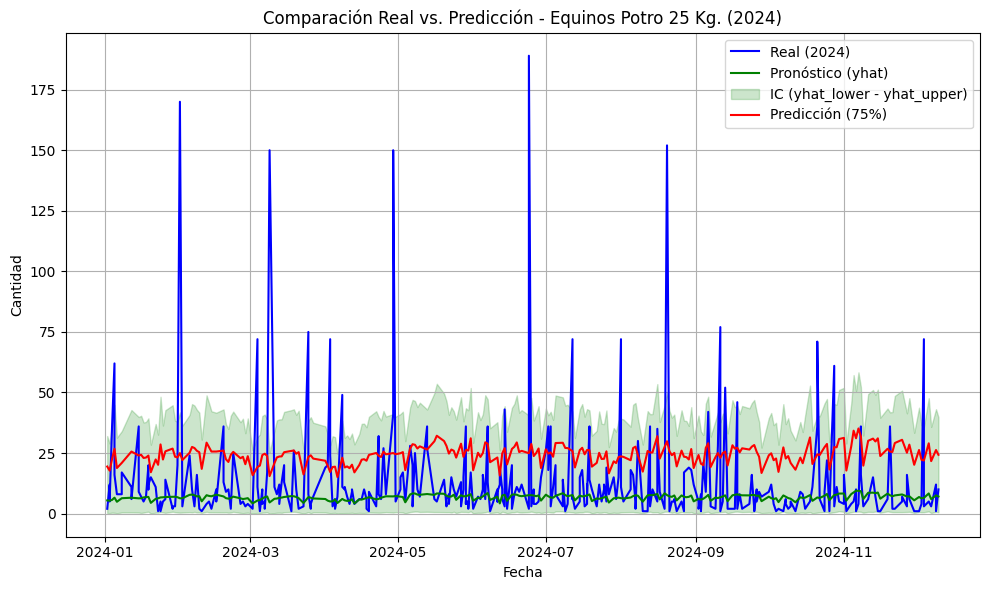

[INFO] CSV de comparación guardado en: Equinos_Potro_25_Kg._comparacion_2024.csv


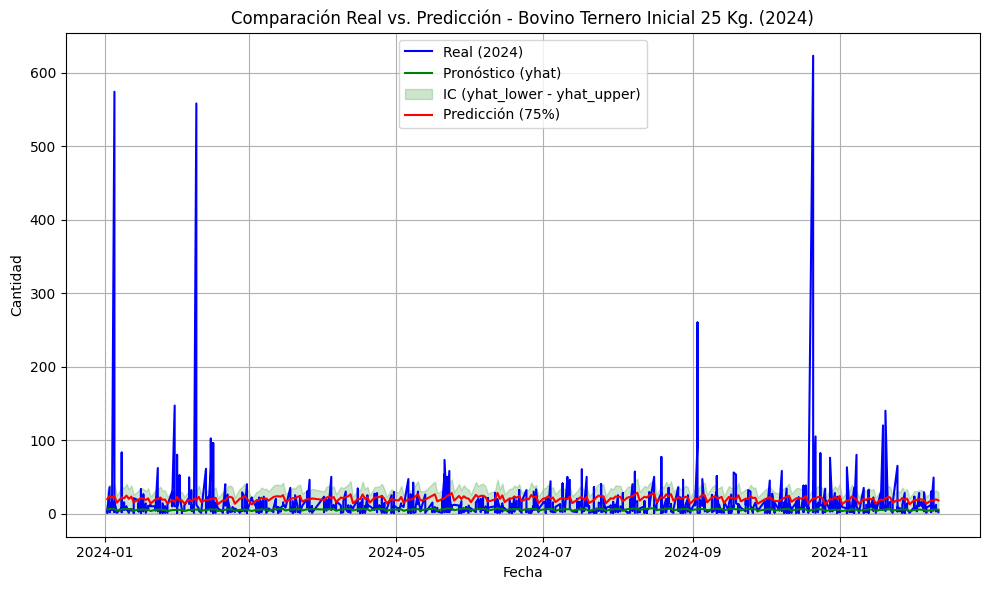

[INFO] CSV de comparación guardado en: Bovino_Ternero_Inicial_25_Kg._comparacion_2024.csv


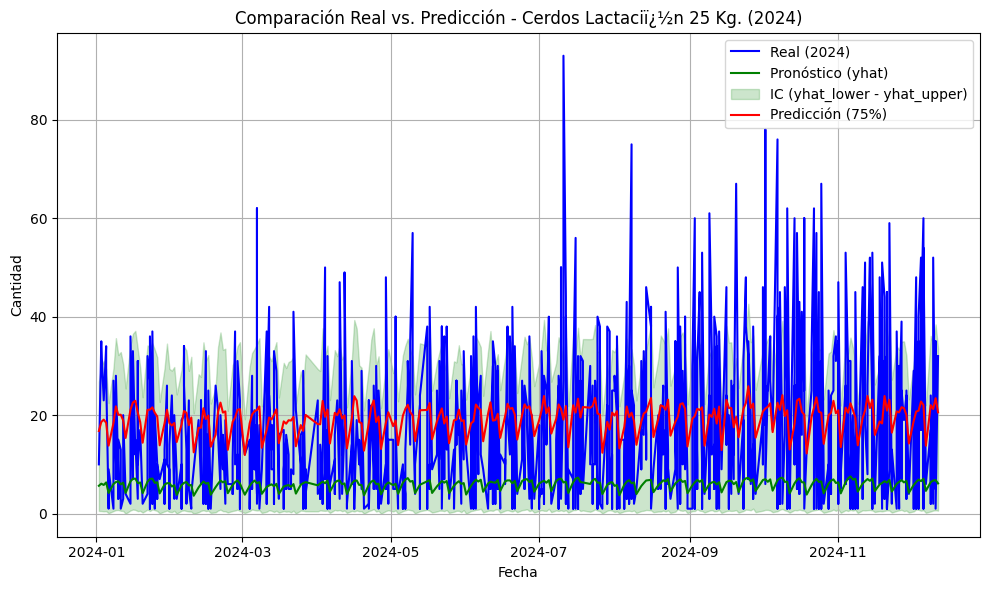

[INFO] CSV de comparación guardado en: Cerdos_Lactaciï¿½n_25_Kg._comparacion_2024.csv


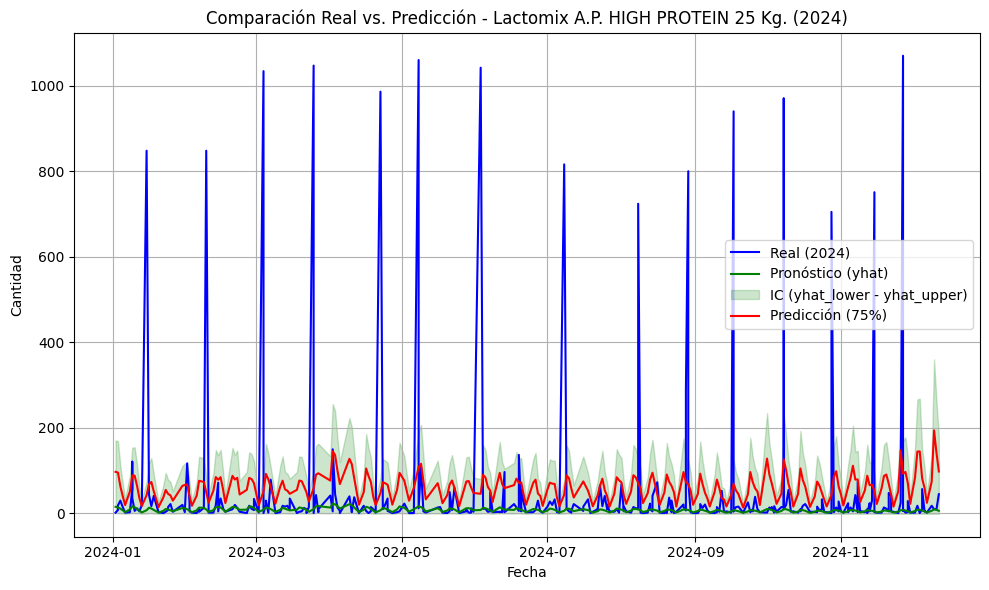

[INFO] CSV de comparación guardado en: Lactomix_A.P._HIGH_PROTEIN_25_Kg._comparacion_2024.csv


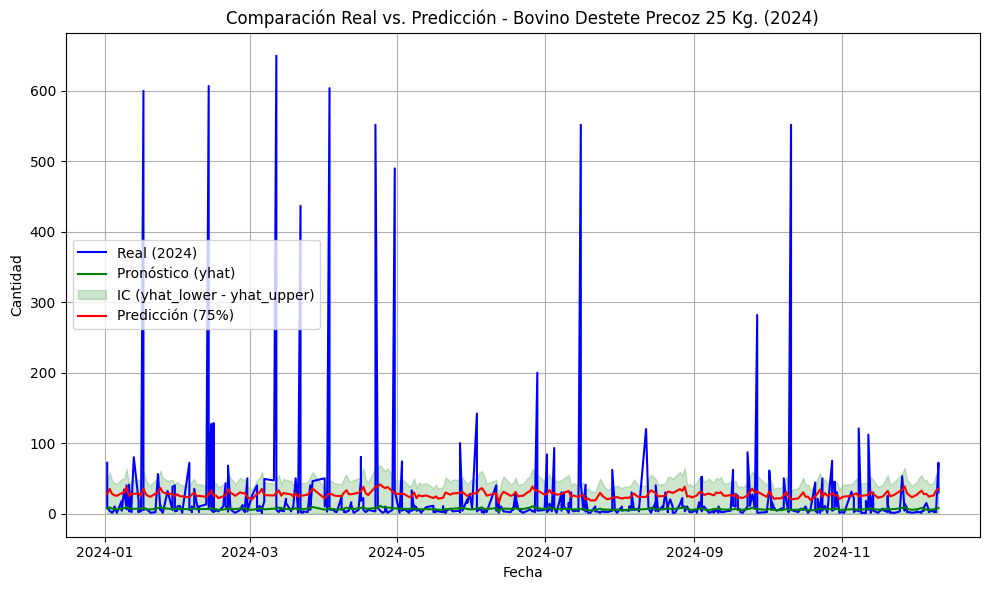

[INFO] CSV de comparación guardado en: Bovino_Destete_Precoz_25_Kg._comparacion_2024.csv


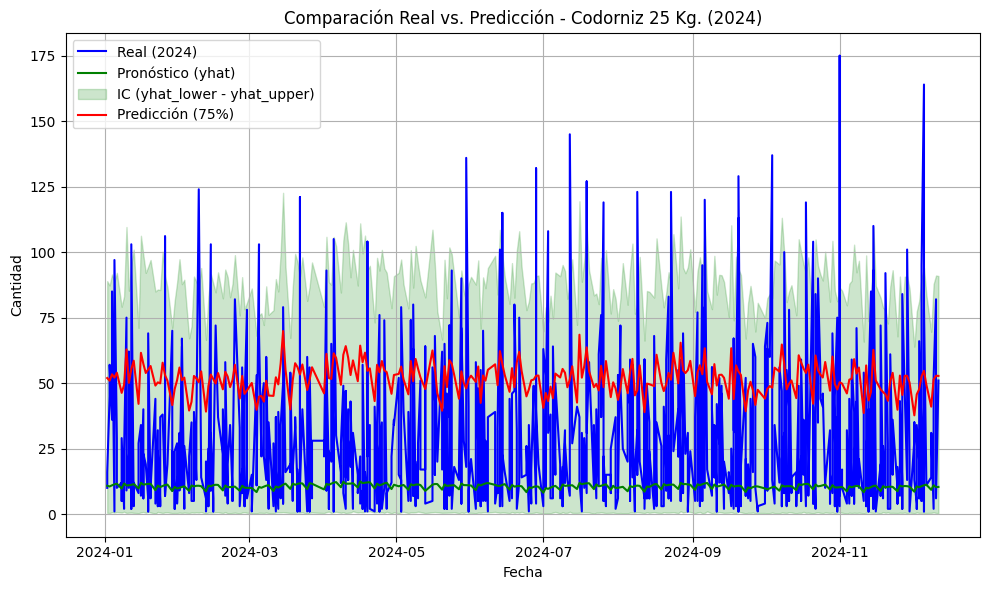

[INFO] CSV de comparación guardado en: Codorniz_25_Kg._comparacion_2024.csv


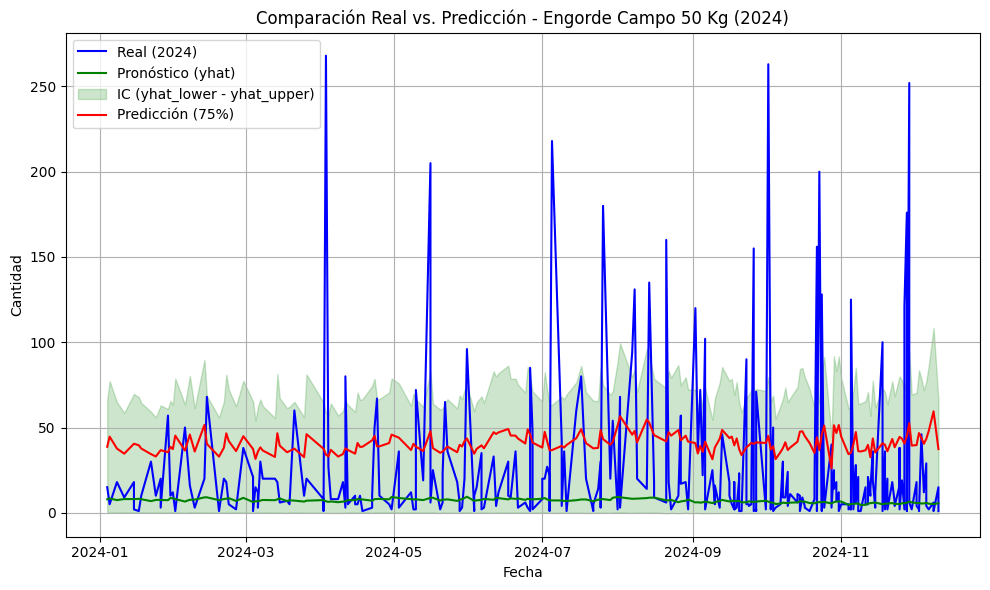

[INFO] CSV de comparación guardado en: Engorde_Campo_50_Kg_comparacion_2024.csv


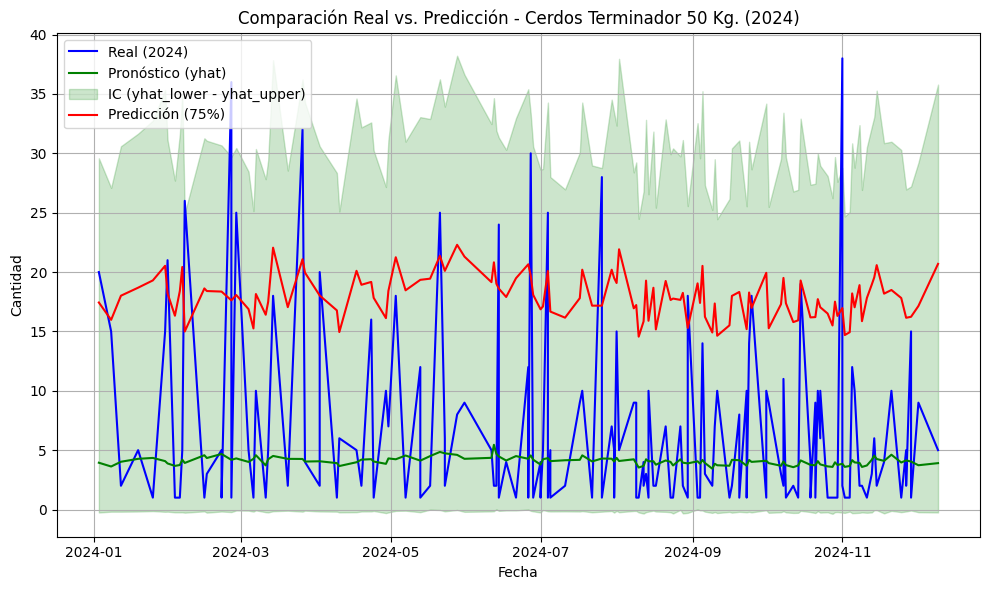

[INFO] CSV de comparación guardado en: Cerdos_Terminador_50_Kg._comparacion_2024.csv


In [63]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------------------------
# 1) Crear la carpeta "mejores_productos" (para guardar los CSV)
# ---------------------------------------------------------------------
best_products_dir = "mejores_productos"
os.makedirs(best_products_dir, exist_ok=True)

# ---------------------------------------------------------------------
# 2) Asegurar que df tenga FECHA como datetime y filtrar datos de 2024
# ---------------------------------------------------------------------
df["FECHA"] = pd.to_datetime(df["FECHA"], format="%d/%m/%Y", errors="coerce")

df_2024 = df[df["FECHA"].dt.year == 2024].copy()
df_2024.rename(columns={"FECHA": "ds", "TOTAL_CANTIDAD": "y"}, inplace=True)

# ---------------------------------------------------------------------
# 3) top_20: DataFrame con las 20 filas (productos) con mejor resultado
# ---------------------------------------------------------------------
# Ejemplo mínimo (ya definido en tu script):
# top_20 = pd.DataFrame({
#     "producto": ["Producto A", "Producto B", ...],
#     "mape_2024": [10.5, 11.2, ...]
# })

# ---------------------------------------------------------------------
# 4) Ubicación de los forecasts con valores positivos
# ---------------------------------------------------------------------
positive_forecast_dir = "forecast_positivos"

# ---------------------------------------------------------------------
# 5) Iterar sobre cada producto en top_20
# ---------------------------------------------------------------------
for idx, row in top_20.iterrows():
    product_name = row["producto"]
    
    # Generar el nombre de archivo
    forecast_filename = product_name.replace(" ", "_") + "_forecast.csv"
    forecast_path = os.path.join(positive_forecast_dir, forecast_filename)
    
    # Verificar si existe ese archivo
    if not os.path.exists(forecast_path):
        print(f"[AVISO] No se encontró forecast para '{product_name}'. Se omite.")
        continue
    
    # 6) Cargar forecast
    forecast_df = pd.read_csv(forecast_path)
    forecast_df["ds"] = pd.to_datetime(forecast_df["ds"])
    
    # Filtrar a datos de 2024
    forecast_2024 = forecast_df[forecast_df["ds"].dt.year == 2024].copy()
    if forecast_2024.empty:
        print(f"[INFO] Forecast de 2024 vacío para '{product_name}'. Se omite.")
        continue
    
    # -----------------------------------------------------------------
    # A) Calcular la columna "yhat_75"
    #    Asumiendo interval_width = 0.95 => yhat_lower ≈ 2.5%, yhat_upper ≈ 97.5%
    #    yhat  = 50%
    #    Queremos 75% => ratio = (0.75 - 0.5) / (0.975 - 0.5) ~ 0.526
    # -----------------------------------------------------------------
    ratio = (0.75 - 0.50) / (0.975 - 0.50)  # ~0.526
    forecast_2024["yhat_75"] = forecast_2024["yhat"] + ratio * (
        forecast_2024["yhat_upper"] - forecast_2024["yhat"]
    )
    
    # 7) Obtener datos reales de df_2024 para este producto
    df_2024_producto = df_2024[df_2024["DESCRIPCION"] == product_name].copy()
    if df_2024_producto.empty:
        print(f"[INFO] No hay datos reales 2024 para '{product_name}'. Se omite.")
        continue
    
    # (Opcional) Calcular precio promedio del 2024 (si hay PRECIO_UNITARIO)
    if "PRECIO_UNITARIO" in df_2024_producto.columns:
        avg_price = df_2024_producto["PRECIO_UNITARIO"].mean()
    else:
        avg_price = np.nan
    
    # 8) Hacer el merge por fecha
    merged_df = pd.merge(
        df_2024_producto[["ds", "y"]],
        forecast_2024[["ds", "yhat", "yhat_75", "yhat_lower", "yhat_upper"]],
        how="inner",
        on="ds"
    )
    if merged_df.empty:
        print(f"[INFO] No hay fechas solapadas para '{product_name}'. Se omite.")
        continue
    
    merged_df["producto"] = product_name
    merged_df["precio_promedio_2024"] = avg_price
    merged_df.sort_values(by="ds", inplace=True)

    # 9) Graficar
    plt.figure(figsize=(10, 6))
    
    # Datos reales (azul)
    plt.plot(merged_df["ds"], merged_df["y"], label="Real (2024)", color="blue")
    
    # Pronóstico central (verde)
    plt.plot(merged_df["ds"], merged_df["yhat"], label="Pronóstico (yhat)", color="green")
    
    # La banda de confianza
    plt.fill_between(
        merged_df["ds"],
        merged_df["yhat_lower"],
        merged_df["yhat_upper"],
        color="green",
        alpha=0.2,
        label="IC (yhat_lower - yhat_upper)"
    )
    
    # Nueva línea: 75% del intervalo (rojo)
    plt.plot(merged_df["ds"], merged_df["yhat_75"], label="Predicción (75%)", color="red")
    
    # Detalles de la gráfica
    plt.title(f"Comparación Real vs. Predicción - {product_name} (2024)")
    plt.xlabel("Fecha")
    plt.ylabel("Cantidad")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    
    # Mostrar la gráfica en el output
    plt.show()
    
    # 10) Guardar CSV de comparación en "mejores_productos"
    csv_filename = product_name.replace(" ", "_") + "_comparacion_2024.csv"
    csv_path = os.path.join(best_products_dir, csv_filename)
    merged_df.to_csv(csv_path, index=False)
    
    print(f"[INFO] CSV de comparación guardado en: {csv_filename}")


[INFO] Pez Crecimiento Plus 32% (3-5mm) - Big Bag 750 Kg: MAE Verde=0.00, Roja=0.00
[INFO] => Pez Crecimiento Plus 32% (3-5mm) - Big Bag 750 Kg: Mejor línea = Verde


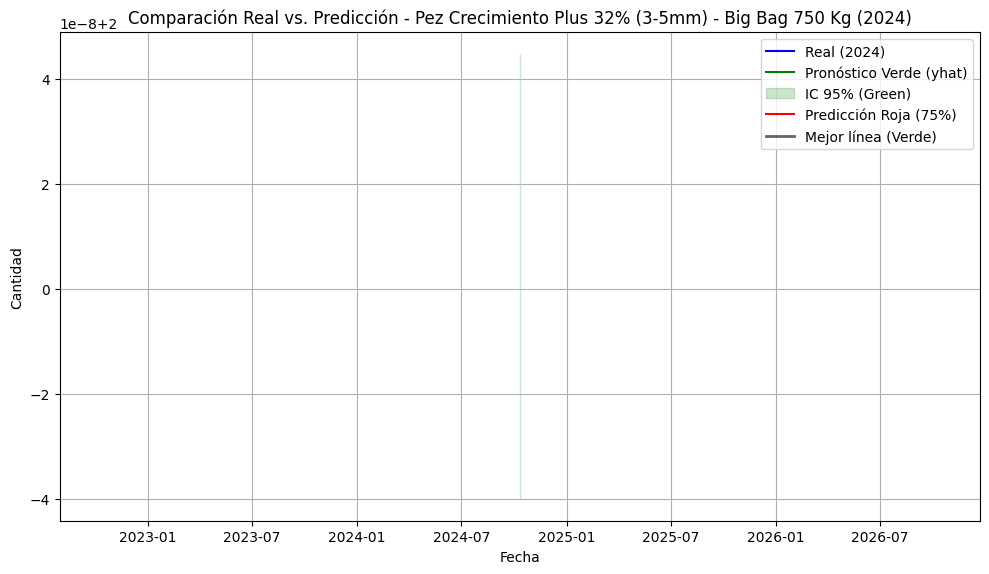

[INFO] CSV de comparación guardado en: Pez_Crecimiento_Plus_32%_(3-5mm)_-_Big_Bag_750_Kg_comparacion_2024.csv
[INFO] Aves Ponedora Big Bag 1250 kg.: MAE Verde=1.43, Roja=4.84
[INFO] => Aves Ponedora Big Bag 1250 kg.: Mejor línea = Verde


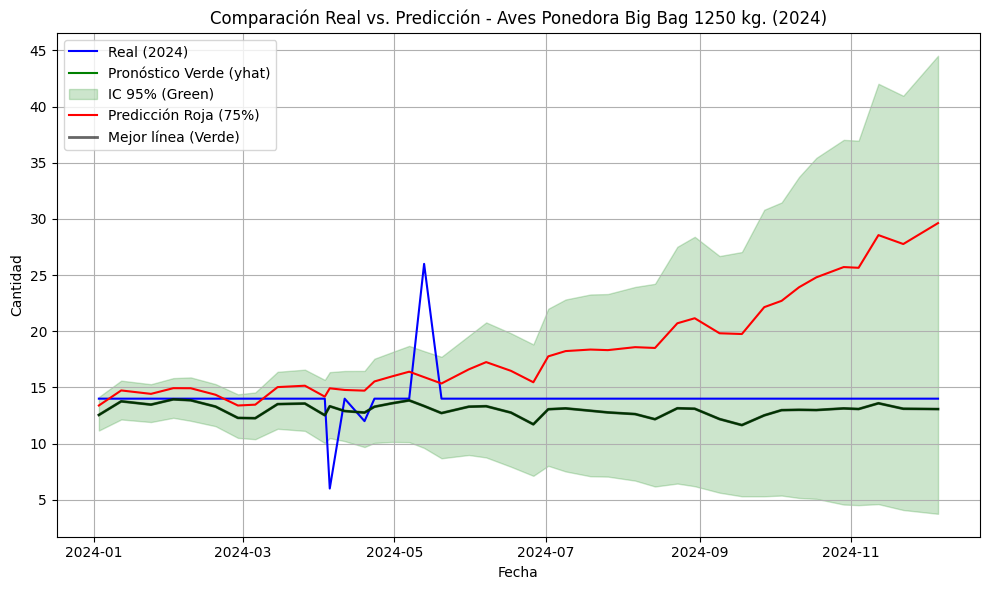

[INFO] CSV de comparación guardado en: Aves_Ponedora_Big_Bag_1250_kg._comparacion_2024.csv
[INFO] Lecheras A.P. 22% Big Bag 1.250 Kg.: MAE Verde=15.50, Roja=55.02
[INFO] => Lecheras A.P. 22% Big Bag 1.250 Kg.: Mejor línea = Verde


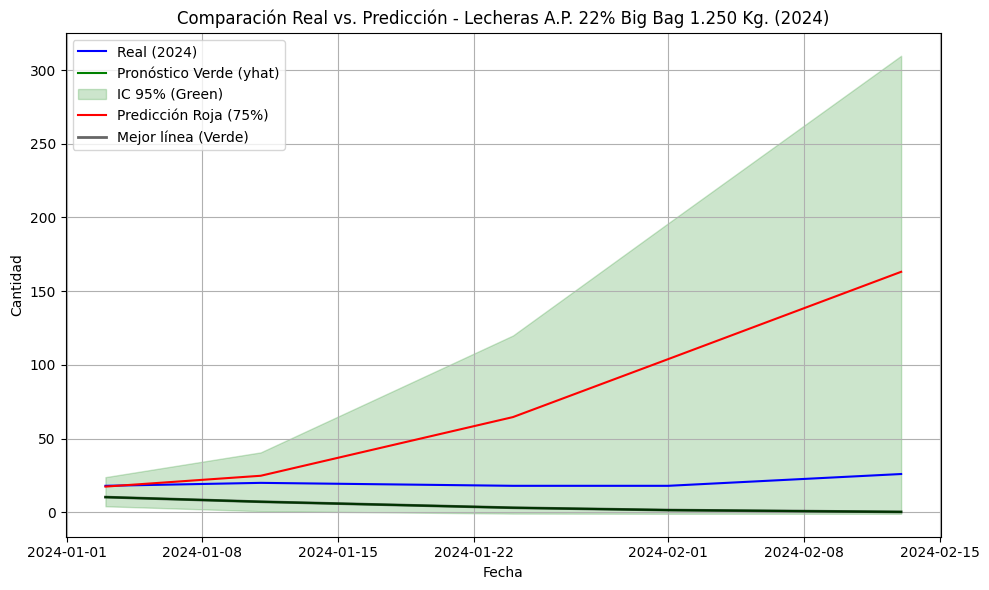

[INFO] CSV de comparación guardado en: Lecheras_A.P._22%_Big_Bag_1.250_Kg._comparacion_2024.csv
[INFO] Lecheras A.P. 20% - 25 Kg: MAE Verde=12.50, Roja=11.94
[INFO] => Lecheras A.P. 20% - 25 Kg: Mejor línea = Roja


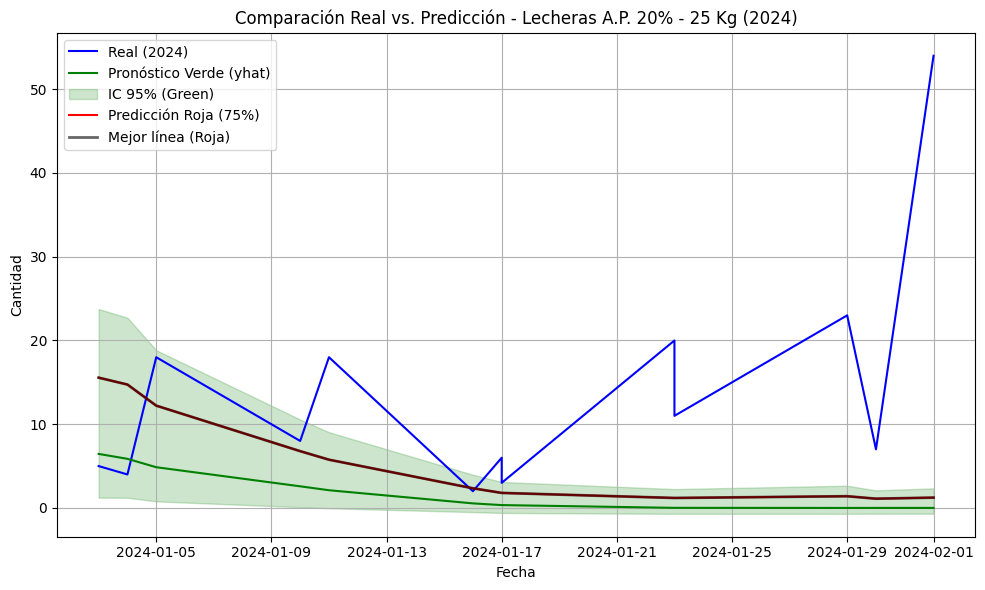

[INFO] CSV de comparación guardado en: Lecheras_A.P._20%_-_25_Kg_comparacion_2024.csv
[INFO] Cerdos Gestaciï¿½n 25 Kg.: MAE Verde=6.75, Roja=8.68
[INFO] => Cerdos Gestaciï¿½n 25 Kg.: Mejor línea = Verde


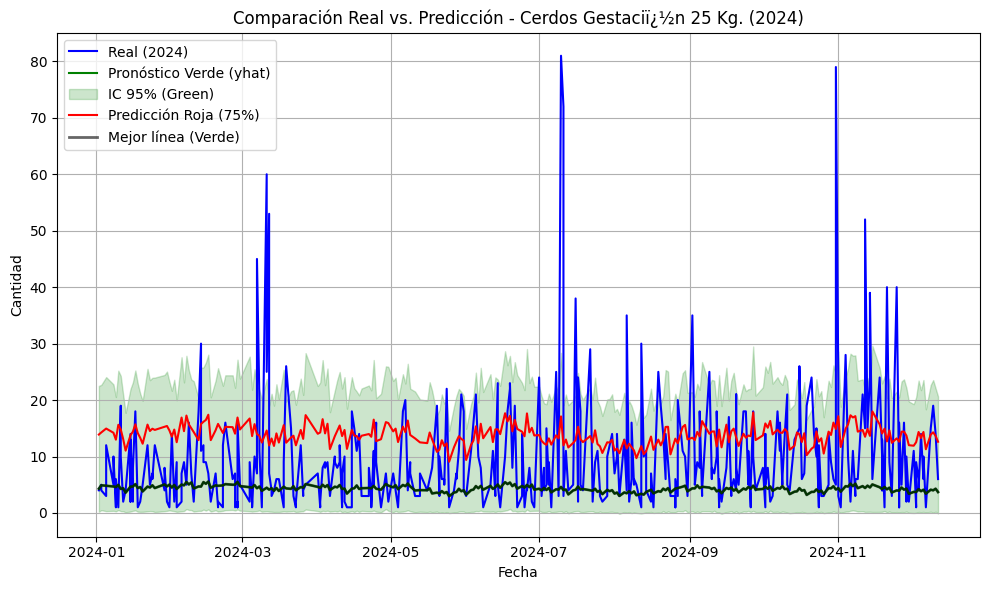

[INFO] CSV de comparación guardado en: Cerdos_Gestaciï¿½n_25_Kg._comparacion_2024.csv
[INFO] Cerdos Iniciador 25 Kg.: MAE Verde=10.08, Roja=9.66
[INFO] => Cerdos Iniciador 25 Kg.: Mejor línea = Roja


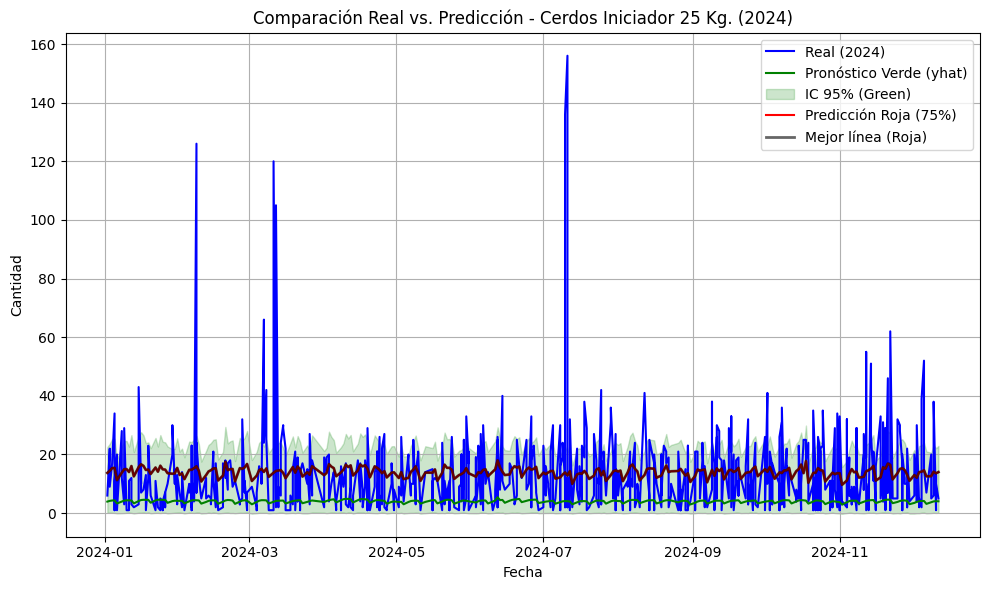

[INFO] CSV de comparación guardado en: Cerdos_Iniciador_25_Kg._comparacion_2024.csv
[INFO] Lecheras A.P. 18% - 25 Kg.: MAE Verde=28.55, Roja=29.72
[INFO] => Lecheras A.P. 18% - 25 Kg.: Mejor línea = Verde


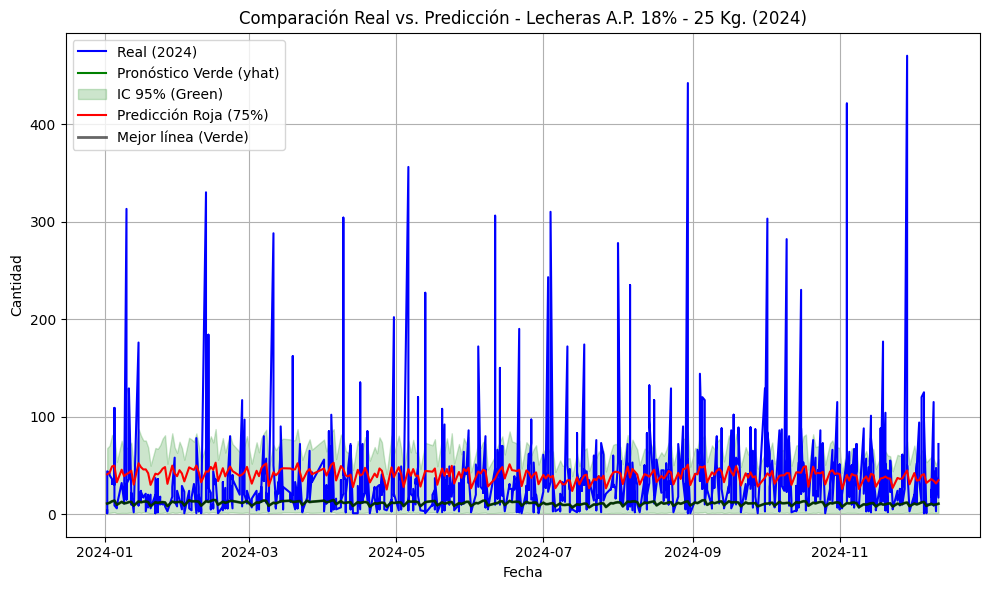

[INFO] CSV de comparación guardado en: Lecheras_A.P._18%_-_25_Kg._comparacion_2024.csv
[INFO] Avestruz 25 Kg.: MAE Verde=4.63, Roja=9.52
[INFO] => Avestruz 25 Kg.: Mejor línea = Verde


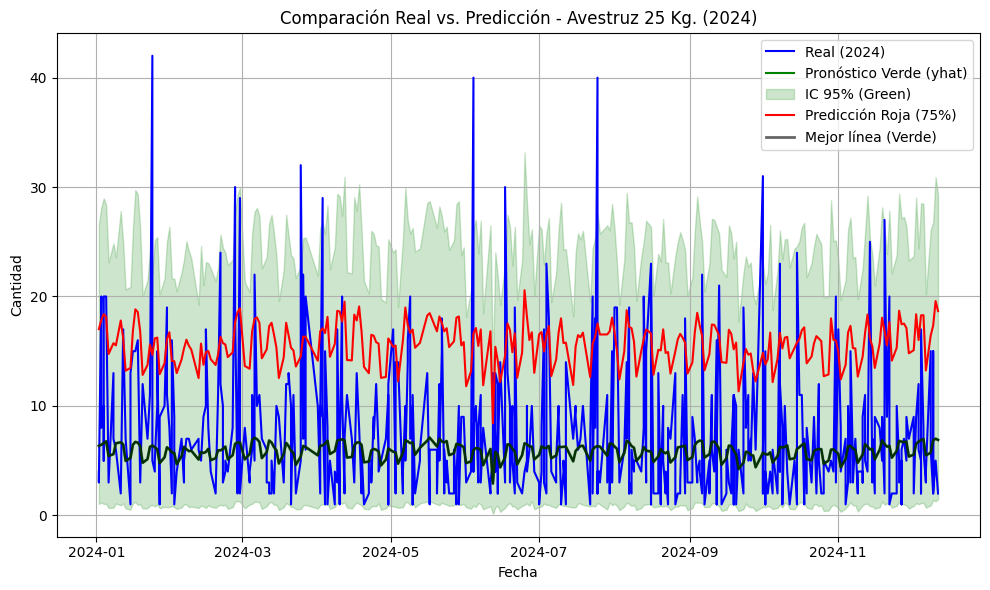

[INFO] CSV de comparación guardado en: Avestruz_25_Kg._comparacion_2024.csv
[INFO] Lactomix AP HIGH PROTEIN-Big Bag 1.250 Kg: MAE Verde=2.86, Roja=6.90
[INFO] => Lactomix AP HIGH PROTEIN-Big Bag 1.250 Kg: Mejor línea = Verde


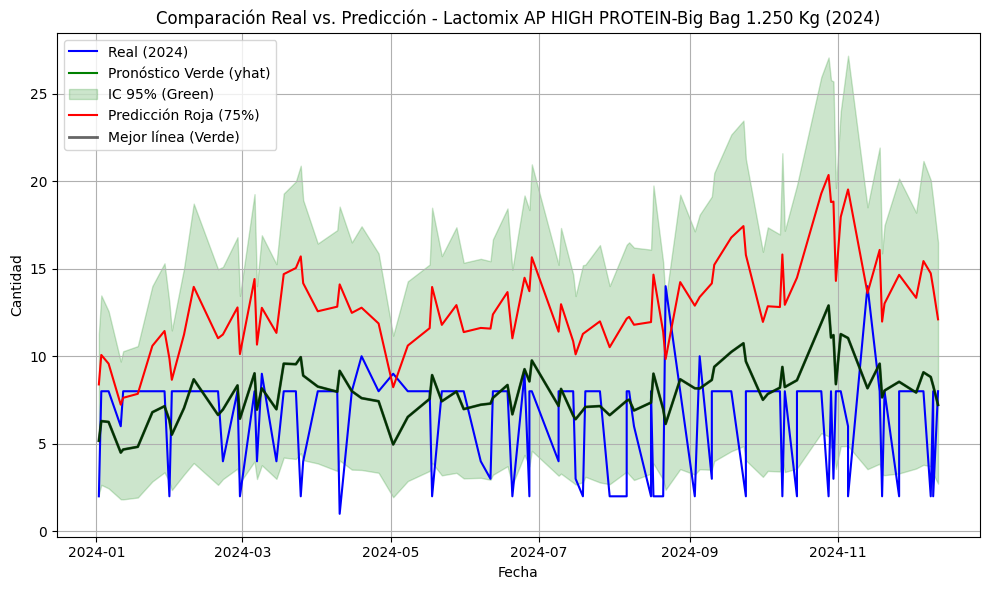

[INFO] CSV de comparación guardado en: Lactomix_AP_HIGH_PROTEIN-Big_Bag_1.250_Kg_comparacion_2024.csv
[INFO] Pez Alevines 40% Polvo - 25 Kg.: MAE Verde=3.76, Roja=7.43
[INFO] => Pez Alevines 40% Polvo - 25 Kg.: Mejor línea = Verde


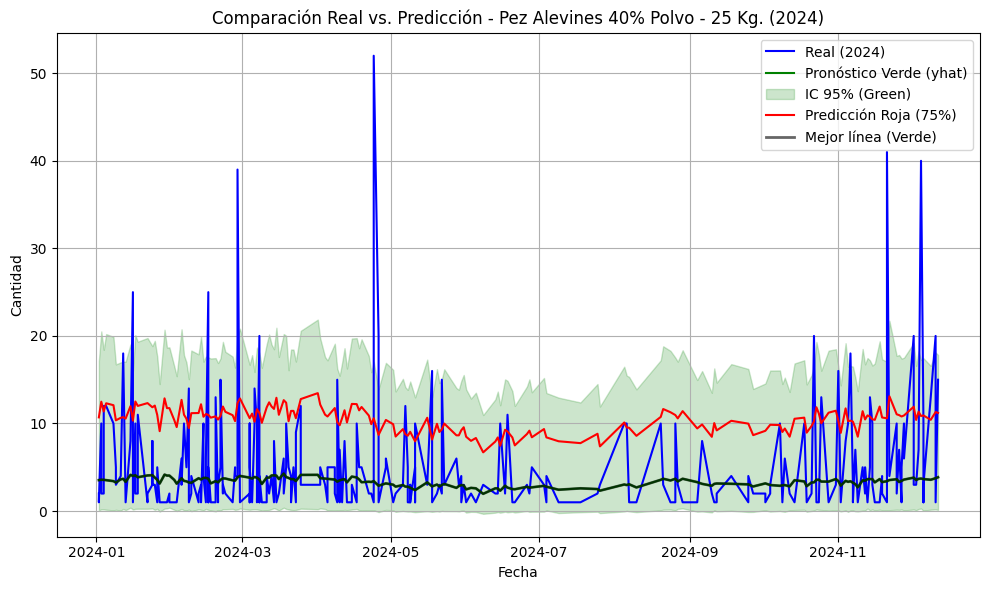

[INFO] CSV de comparación guardado en: Pez_Alevines_40%_Polvo_-_25_Kg._comparacion_2024.csv
[INFO] Desmamante Campo 25 Kg.: MAE Verde=18.70, Roja=26.45
[INFO] => Desmamante Campo 25 Kg.: Mejor línea = Verde


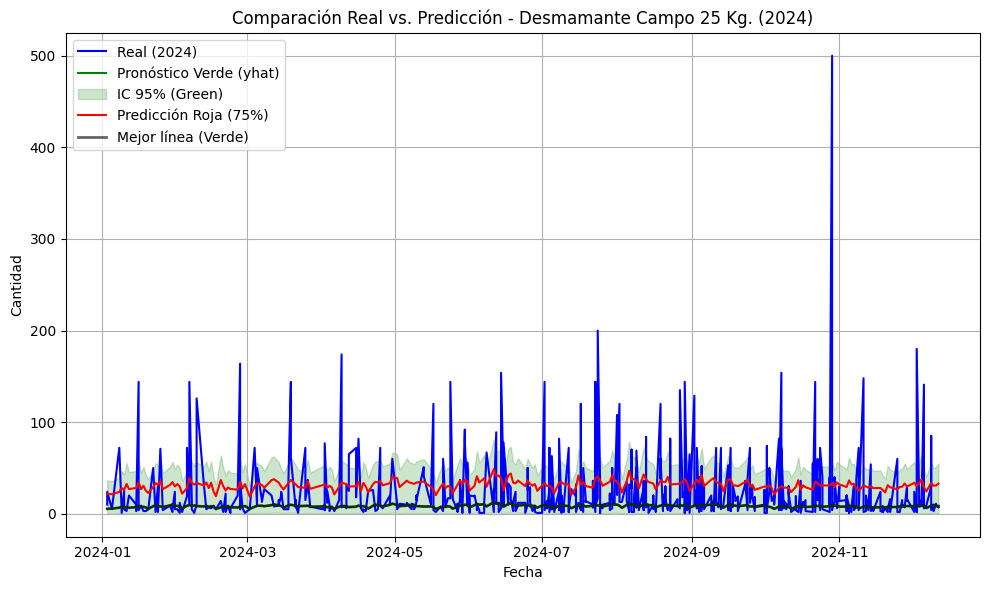

[INFO] CSV de comparación guardado en: Desmamante_Campo_25_Kg._comparacion_2024.csv
[INFO] Lecheras A.P. 18% - 50 Kg.: MAE Verde=36.11, Roja=44.41
[INFO] => Lecheras A.P. 18% - 50 Kg.: Mejor línea = Verde


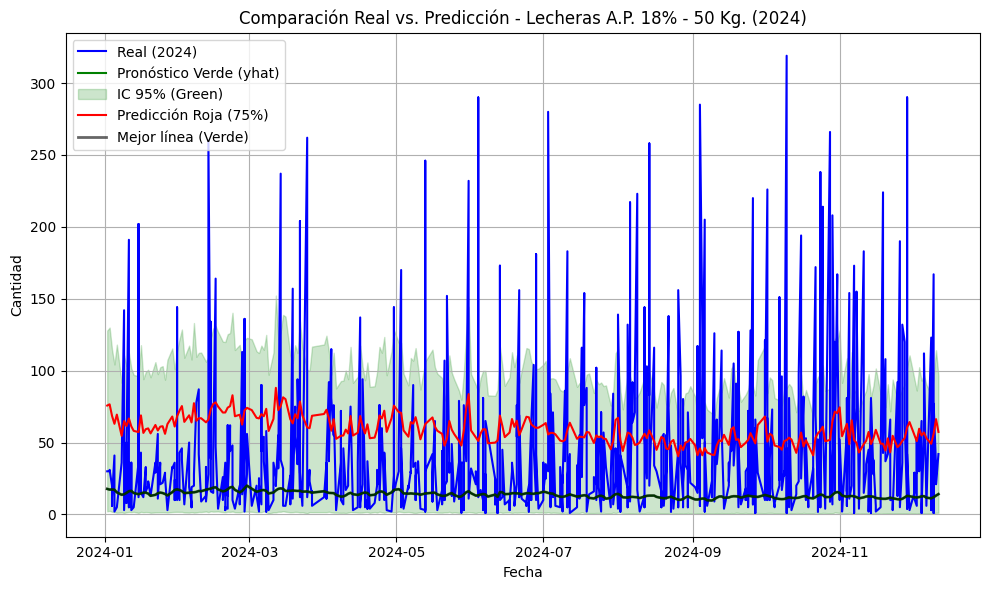

[INFO] CSV de comparación guardado en: Lecheras_A.P._18%_-_50_Kg._comparacion_2024.csv
[INFO] Equinos Potro 25 Kg.: MAE Verde=10.33, Roja=18.96
[INFO] => Equinos Potro 25 Kg.: Mejor línea = Verde


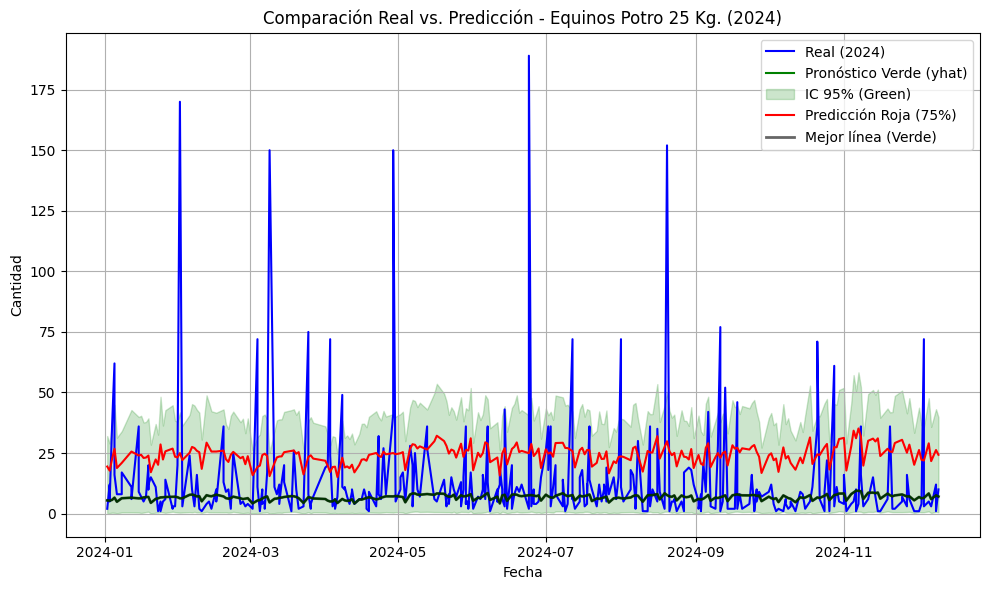

[INFO] CSV de comparación guardado en: Equinos_Potro_25_Kg._comparacion_2024.csv
[INFO] Bovino Ternero Inicial 25 Kg.: MAE Verde=11.07, Roja=16.53
[INFO] => Bovino Ternero Inicial 25 Kg.: Mejor línea = Verde


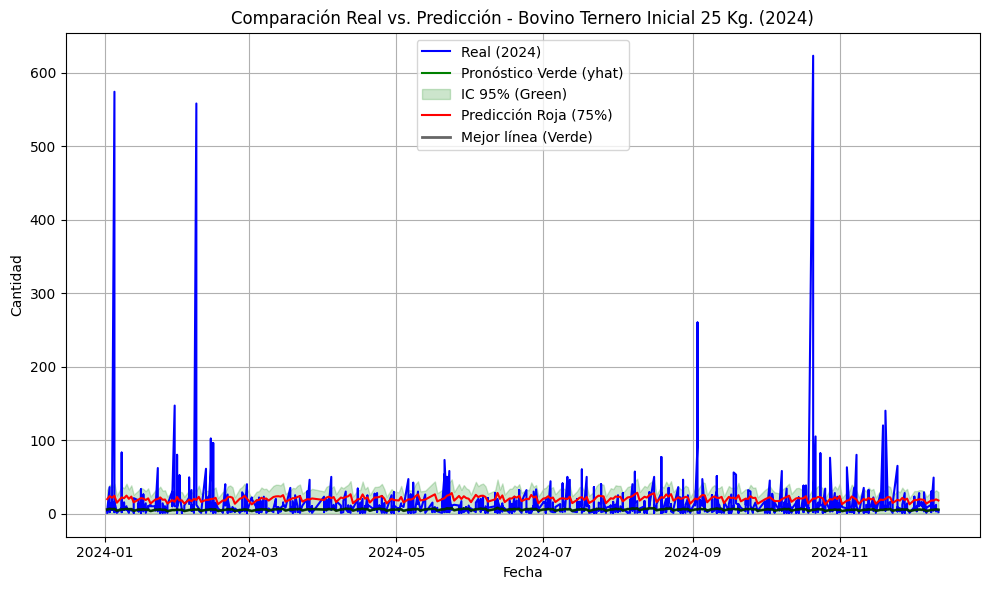

[INFO] CSV de comparación guardado en: Bovino_Ternero_Inicial_25_Kg._comparacion_2024.csv
[INFO] Cerdos Lactaciï¿½n 25 Kg.: MAE Verde=13.47, Roja=12.99
[INFO] => Cerdos Lactaciï¿½n 25 Kg.: Mejor línea = Roja


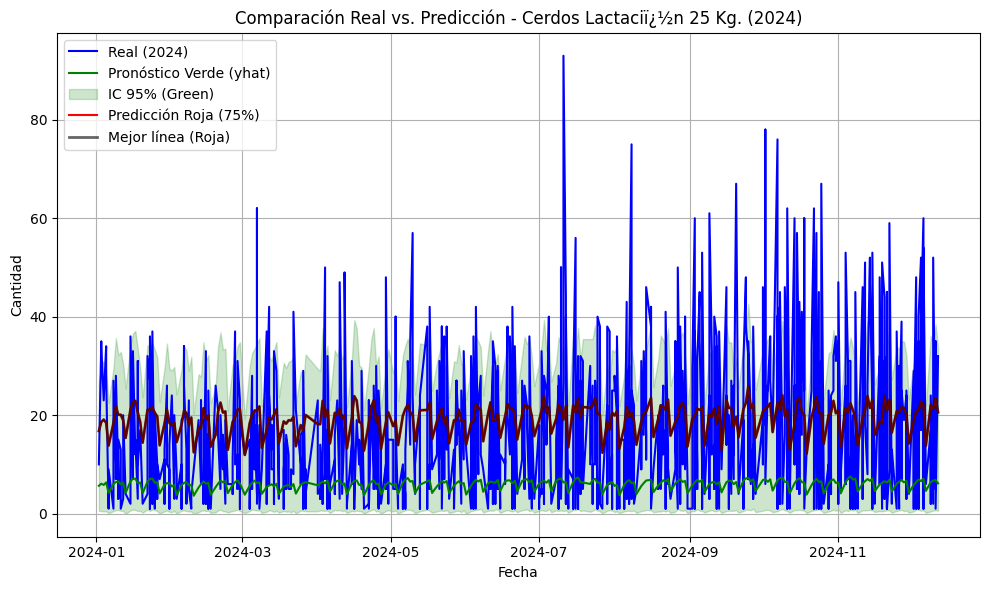

[INFO] CSV de comparación guardado en: Cerdos_Lactaciï¿½n_25_Kg._comparacion_2024.csv
[INFO] Lactomix A.P. HIGH PROTEIN 25 Kg.: MAE Verde=51.81, Roja=86.49
[INFO] => Lactomix A.P. HIGH PROTEIN 25 Kg.: Mejor línea = Verde


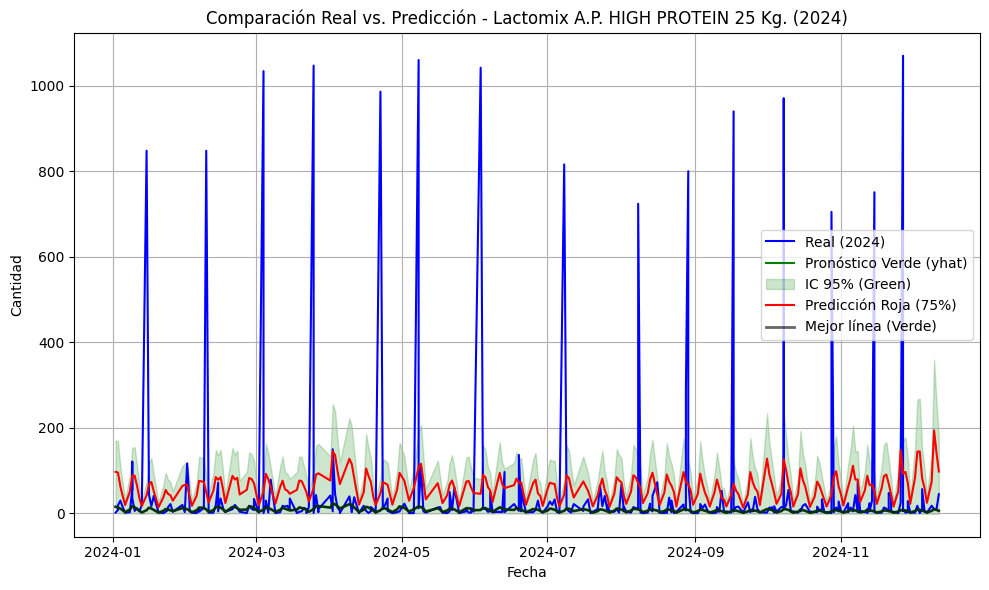

[INFO] CSV de comparación guardado en: Lactomix_A.P._HIGH_PROTEIN_25_Kg._comparacion_2024.csv
[INFO] Bovino Destete Precoz 25 Kg.: MAE Verde=22.05, Roja=32.80
[INFO] => Bovino Destete Precoz 25 Kg.: Mejor línea = Verde


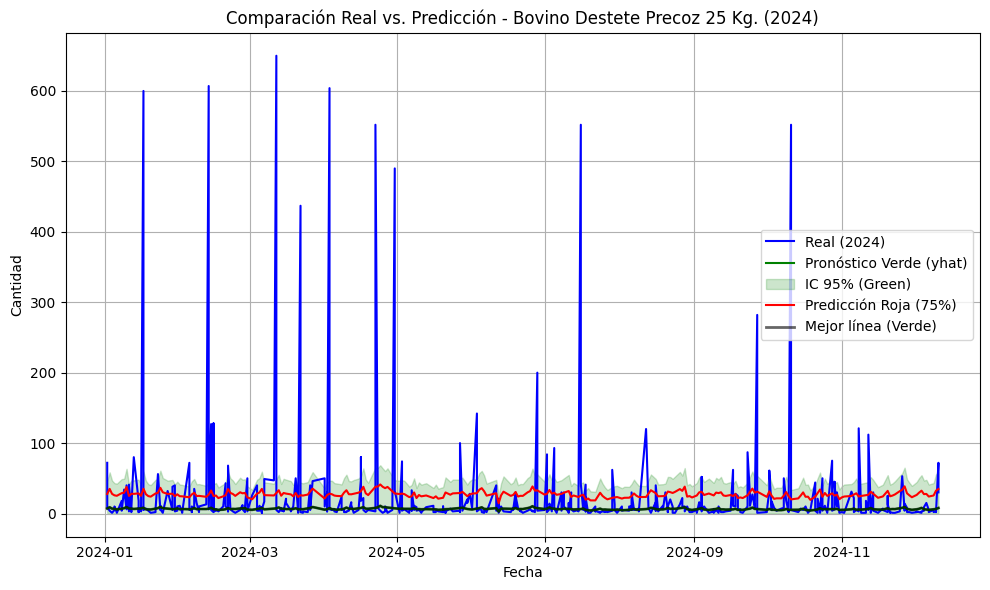

[INFO] CSV de comparación guardado en: Bovino_Destete_Precoz_25_Kg._comparacion_2024.csv
[INFO] Codorniz 25 Kg.: MAE Verde=22.63, Roja=33.11
[INFO] => Codorniz 25 Kg.: Mejor línea = Verde


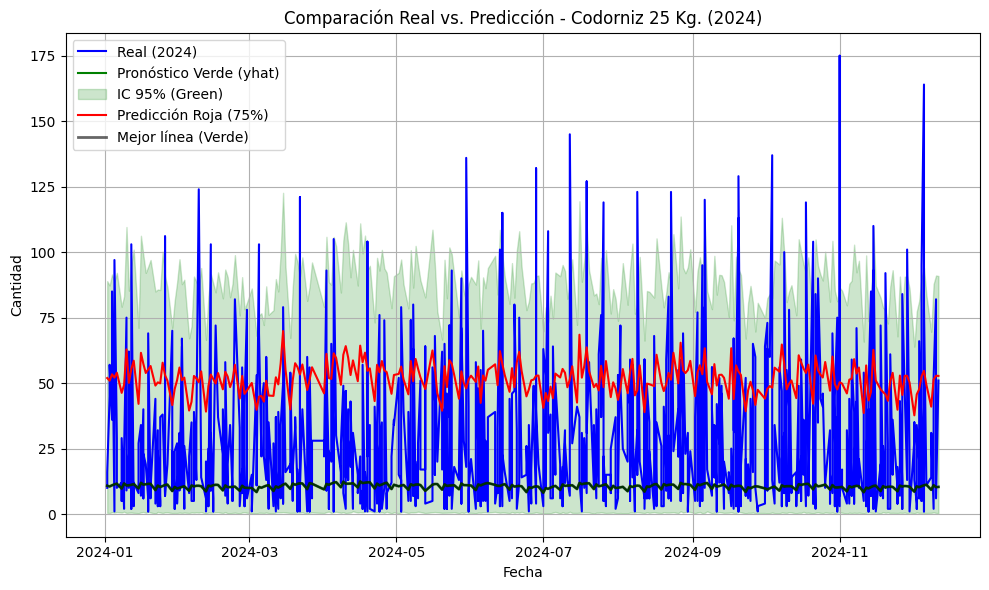

[INFO] CSV de comparación guardado en: Codorniz_25_Kg._comparacion_2024.csv
[INFO] Engorde Campo 50 Kg: MAE Verde=22.39, Roja=35.87
[INFO] => Engorde Campo 50 Kg: Mejor línea = Verde


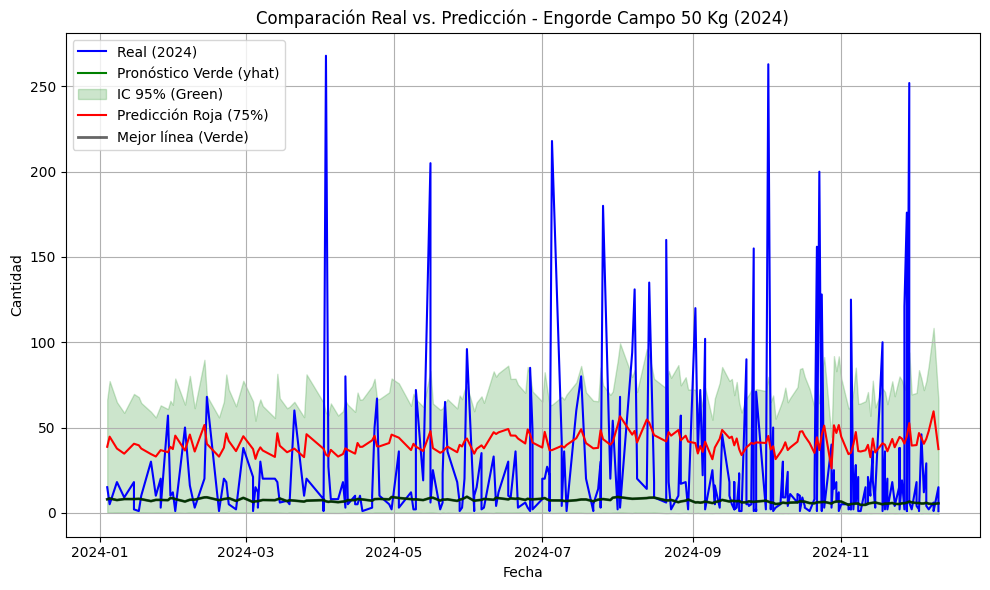

[INFO] CSV de comparación guardado en: Engorde_Campo_50_Kg_comparacion_2024.csv
[INFO] Cerdos Terminador 50 Kg.: MAE Verde=5.22, Roja=12.62
[INFO] => Cerdos Terminador 50 Kg.: Mejor línea = Verde


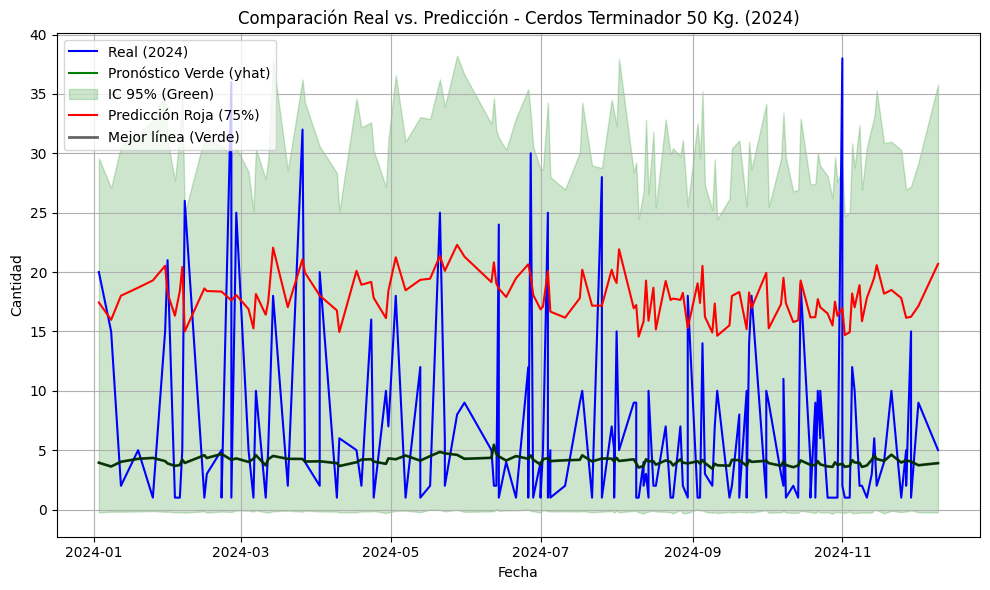

[INFO] CSV de comparación guardado en: Cerdos_Terminador_50_Kg._comparacion_2024.csv
[INFO] merged_data.csv guardado con éxito.


In [74]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------------------------
# 1) Crear la carpeta "mejores_productos" (para guardar los CSV de comparación)
# ---------------------------------------------------------------------
best_products_dir = "mejores_productos"
os.makedirs(best_products_dir, exist_ok=True)

# ---------------------------------------------------------------------
# 2) Asegurar que df tenga FECHA como datetime y filtrar datos de 2024
# ---------------------------------------------------------------------
df["FECHA"] = pd.to_datetime(df["FECHA"], format="%d/%m/%Y", errors="coerce")

df_2024 = df[df["FECHA"].dt.year == 2024].copy()
df_2024.rename(columns={"FECHA": "ds", "TOTAL_CANTIDAD": "y"}, inplace=True)

# ---------------------------------------------------------------------
# 3) top_20: DataFrame con las 20 filas (productos) con mejor resultado
#    Ejemplo de estructura (ajusta según tu caso):
# ---------------------------------------------------------------------
# top_20 = pd.DataFrame({
#     "producto": ["Producto A", "Producto B", ...],
#     "mape_2024": [10.5, 11.2, ...]
# })

# ---------------------------------------------------------------------
# 4) Ubicación de los forecasts con valores positivos
# ---------------------------------------------------------------------
positive_forecast_dir = "forecast_positivos"

# ---------------------------------------------------------------------
# 5) (NUEVO) DataFrame global para almacenar la mejor línea en merged_data.csv
# ---------------------------------------------------------------------
best_lines_data = []

# ---------------------------------------------------------------------
# 6) Iterar sobre cada producto en top_20
# ---------------------------------------------------------------------
for idx, row in top_20.iterrows():
    product_name = row["producto"]
    
    # Generar el nombre de archivo del forecast
    forecast_filename = product_name.replace(" ", "_") + "_forecast.csv"
    forecast_path = os.path.join(positive_forecast_dir, forecast_filename)
    
    if not os.path.exists(forecast_path):
        print(f"[AVISO] No se encontró forecast para '{product_name}'. Se omite.")
        continue
    
    # 7) Cargar forecast y filtrar datos de 2024
    forecast_df = pd.read_csv(forecast_path)
    forecast_df["ds"] = pd.to_datetime(forecast_df["ds"], errors="coerce")
    
    forecast_2024 = forecast_df[forecast_df["ds"].dt.year == 2024].copy()
    if forecast_2024.empty:
        print(f"[INFO] Forecast 2024 vacío para '{product_name}'. Se omite.")
        continue
    
    # -----------------------------------------------------------------
    # A) Calcular la columna "yhat_75"
    #    (Asumiendo interval_width=0.95 => yhat_lower=2.5%, yhat_upper=97.5%)
    #    yhat=50% y queremos 75% => ratio = (0.75 - 0.50)/(0.975 - 0.50) ~ 0.526
    # -----------------------------------------------------------------
    ratio = (0.75 - 0.50) / (0.975 - 0.50)  # ~0.526
    forecast_2024["yhat_75"] = forecast_2024["yhat"] + ratio * (
        forecast_2024["yhat_upper"] - forecast_2024["yhat"]
    )
    
    # -----------------------------------------------------------------
    # B) Obtener datos reales (2024) de este producto
    # -----------------------------------------------------------------
    df_2024_producto = df_2024[df_2024["DESCRIPCION"] == product_name].copy()
    if df_2024_producto.empty:
        print(f"[INFO] No hay datos reales 2024 para '{product_name}'. Se omite.")
        continue
    
    # Merge por fecha para comparar real vs predicción
    merged_df = pd.merge(
        df_2024_producto[["ds", "y", "PRECIO_UNITARIO"]],  # daily
        forecast_2024[["ds", "yhat", "yhat_75", "yhat_lower", "yhat_upper"]],
        how="inner",
        on="ds"
    )
    if merged_df.empty:
        print(f"[INFO] No hay fechas solapadas para '{product_name}'. Se omite.")
        continue
    
    merged_df["producto"] = product_name
    merged_df.sort_values(by="ds", inplace=True)

    # -----------------------------------------------------------------
    # C) Calcular MAE de la línea verde (yhat) y la roja (yhat_75)
    # -----------------------------------------------------------------
    mae_green = np.mean(np.abs(merged_df["y"] - merged_df["yhat"]))
    mae_red   = np.mean(np.abs(merged_df["y"] - merged_df["yhat_75"]))
    
    print(f"[INFO] {product_name}: MAE Verde={mae_green:.2f}, Roja={mae_red:.2f}")
    
    # -----------------------------------------------------------------
    # D) Escoger la línea que tenga menor MAE
    # -----------------------------------------------------------------
    if mae_green <= mae_red:
        # Usar la verde (yhat)
        merged_df["chosen_line"] = merged_df["yhat"]
        mejor_color = "Verde"
    else:
        # Usar la roja (yhat_75)
        merged_df["chosen_line"] = merged_df["yhat_75"]
        mejor_color = "Roja"
    
    print(f"[INFO] => {product_name}: Mejor línea = {mejor_color}")
    
    # -----------------------------------------------------------------
    # E) Graficar (opcional) para ver las 3 líneas
    # -----------------------------------------------------------------
    plt.figure(figsize=(10, 6))
    
    # Real (azul)
    plt.plot(merged_df["ds"], merged_df["y"], label="Real (2024)", color="blue")
    
    # Pronóstico verde
    plt.plot(merged_df["ds"], merged_df["yhat"], label="Pronóstico Verde (yhat)", color="green")
    
    # Banda
    plt.fill_between(
        merged_df["ds"],
        merged_df["yhat_lower"],
        merged_df["yhat_upper"],
        color="green",
        alpha=0.2,
        label="IC 95% (Green)"
    )
    
    # Línea Roja (yhat_75)
    plt.plot(merged_df["ds"], merged_df["yhat_75"], label="Predicción Roja (75%)", color="red")
    
    # Destacar la elegida con un trazo grueso
    plt.plot(
        merged_df["ds"],
        merged_df["chosen_line"],
        label=f"Mejor línea ({mejor_color})",
        color="black",
        linewidth=2, alpha=0.6
    )
    
    plt.title(f"Comparación Real vs. Predicción - {product_name} (2024)")
    plt.xlabel("Fecha")
    plt.ylabel("Cantidad")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    # -----------------------------------------------------------------
    # F) Guardar CSV de comparación en "mejores_productos"
    # -----------------------------------------------------------------
    comparacion_filename = product_name.replace(" ", "_") + "_comparacion_2024.csv"
    comparacion_path = os.path.join(best_products_dir, comparacion_filename)
    merged_df.to_csv(comparacion_path, index=False)
    
    print(f"[INFO] CSV de comparación guardado en: {comparacion_filename}")
    
    # -----------------------------------------------------------------
    # G) Guardar en el DataFrame global "best_lines_data" 
    #    Solo las columnas pedidas: ds, yhat, PRODUCT, PRECIO_UNITARIO
    #    (El yhat es la chosen_line)
    # -----------------------------------------------------------------
    subset_df = merged_df[["ds", "chosen_line", "producto", "PRECIO_UNITARIO"]].copy()
    # Renombramos chosen_line => yhat
    subset_df.rename(columns={"chosen_line": "yhat", 
                              "producto": "PRODUCT"}, 
                     inplace=True)
    
    best_lines_data.append(subset_df)

# ---------------------------------------------------------------------
# 7) Al finalizar el bucle de los 20 productos,
#    concatenamos y guardamos "merged_data.csv"
# ---------------------------------------------------------------------
if best_lines_data:
    final_df = pd.concat(best_lines_data, ignore_index=True)
    final_df.to_csv("merged_data.csv", index=False)
    print("[INFO] merged_data.csv guardado con éxito.")
else:
    print("[INFO] No se generó contenido para merged_data.csv.")


In [77]:
# Ajuste final para asegurar que VENTAS_REALES contenga la cantidad real vendida

best_lines_data = []  # Reiniciamos la lista

# Iterar sobre top_20 productos
for idx, row in top_20.iterrows():
    product_name = row["producto"]
    
    # Generar nombre de archivo del forecast
    forecast_filename = product_name.replace(" ", "_") + "_forecast.csv"
    forecast_path = os.path.join(positive_forecast_dir, forecast_filename)
    
    if not os.path.exists(forecast_path):
        print(f"[AVISO] No se encontró forecast para '{product_name}'. Se omite.")
        continue
    
    # Cargar forecast y filtrar datos de 2024
    forecast_df = pd.read_csv(forecast_path)
    forecast_df["ds"] = pd.to_datetime(forecast_df["ds"], errors="coerce")
    forecast_2024 = forecast_df[forecast_df["ds"].dt.year == 2024].copy()
    
    if forecast_2024.empty:
        print(f"[INFO] Forecast 2024 vacío para '{product_name}'. Se omite.")
        continue
    
    # Calcular la columna "yhat_75"
    ratio = (0.75 - 0.50) / (0.975 - 0.50)  # ~0.526
    forecast_2024["yhat_75"] = forecast_2024["yhat"] + ratio * (
        forecast_2024["yhat_upper"] - forecast_2024["yhat"]
    )
    
    # Obtener datos reales de 2024 para el producto
    df_2024_producto = df_2024[df_2024["DESCRIPCION"] == product_name].copy()
    if df_2024_producto.empty:
        print(f"[INFO] No hay datos reales 2024 para '{product_name}'. Se omite.")
        continue
    
    # Merge por fecha
    merged_df = pd.merge(
        df_2024_producto[["ds", "y", "PRECIO_UNITARIO"]],
        forecast_2024[["ds", "yhat", "yhat_75", "yhat_lower", "yhat_upper"]],
        how="inner",
        on="ds"
    )
    
    if merged_df.empty:
        print(f"[INFO] No hay fechas solapadas para '{product_name}'. Se omite.")
        continue
    
    # Calcular MAE
    mae_green = np.mean(np.abs(merged_df["y"] - merged_df["yhat"]))
    mae_red = np.mean(np.abs(merged_df["y"] - merged_df["yhat_75"]))
    
    # Escoger la mejor línea
    if mae_green <= mae_red:
        merged_df["chosen_line"] = merged_df["yhat"]
    else:
        merged_df["chosen_line"] = merged_df["yhat_75"]
    
    # Preparar DataFrame para el CSV final
    subset_df = merged_df[["ds", "chosen_line", "PRECIO_UNITARIO", "y"]].copy()
    subset_df.rename(columns={
        "chosen_line": "yhat", 
        "y": "VENTAS_REALES"
    }, inplace=True)
    subset_df["PRODUCT"] = product_name  # Agregar nombre del producto
    
    best_lines_data.append(subset_df)

# Concatenar todos los productos y guardar el CSV
if best_lines_data:
    final_df = pd.concat(best_lines_data, ignore_index=True)
    output_path = "merged_data.csv"
    final_df.to_csv(output_path, index=False)
    print(f"[INFO] merged_data.csv guardado en {output_path}.")
else:
    print("[INFO] No se generó contenido para merged_data.csv.")



[INFO] merged_data.csv guardado en merged_data.csv.
